In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt
import sys
import coffea.util as util
import time
import json
import os
import copy
from hist import Hist
sys.path.append("../../analysisTools/")
import plotTools as ptools
import mplhep as hep
import utils
hep.style.use("CMS")
plt.rcParams['font.size'] = 16.0
from matplotlib.colors import Normalize, LogNorm
from copy import deepcopy
from tqdm import tqdm

In [2]:
class histContainer:
    def __init__(self,path):
        self.histos, self.metadata = util.load(path)
        self.hnames = list(self.histos.keys())
    def load(self,hname):
        return self.histos[hname]
    def load(self,hname):
        return self.histos[hname]
    def names(self,spec=None):
        if spec is not None:
            print("\n".join([h for h in self.hnames if spec in h]))
        else:
            print("\n".join(self.hnames))

In [3]:
hcs = histContainer("signal_histos_sig_defaultGoodVtx.coffea")
dfs = utils.get_dict_fromCutflow(hcs.load('cutflow'))
def make_label(row):
    m1 = int(row['m1'])
    delta = int(100*row['delta'])
    ct = int(row['ctau'])
    label = f"{delta}%, {m1} GeV, {ct} mm"
    return label
dfs['legend'] = dfs.apply(make_label,axis=1)

In [4]:
def plot_samples(loader,hname,selection,samples,labels,outName,outD,
                 xlabel=None,ylabel=None,title=None,xlim=None,ylim=None,
                 ncol_leg=1,figsize=None,logy=False,logx=False,rebin=1j,
                 save=True,show=False,density=True,yerr=True):
    if not figsize:
        figsize=(8,6)
    plt.figure(figsize=figsize)
    h = loader.load(hname)[selection]
    histos = [h[{"samp":s}][::rebin] for s in samples]
    hep.histplot(histos,label=labels,density=density,yerr=yerr)
    plt.legend(ncol=ncol_leg)
    if xlabel:
        plt.xlabel(xlabel)
    if ylabel:
        plt.ylabel(ylabel)
    if xlim:
        plt.xlim(xlim)
    if ylim:
        plt.ylim(ylim)
    if title:
        plt.title(title)
    if logy:
        plt.yscale('log')
    if logx:
        plt.xscale('log')
    plt.tight_layout()
    if save:
        os.makedirs(outD,exist_ok=True)
        plt.savefig(f"{outD}/{outName}.pdf")
    if not show:
        plt.close()

In [5]:
def make_cdf_summary(loader,hname,selection,outName,outD,right=True,
                 xlabel=None,ylabel=None,title=None,xlim=None,ylim=None,
                 ncol_leg=1,figsize=None,logy=False,logx=False,alpha=1,
                 save=True,show=False):
    if not figsize:
        figsize=(8,6)
    plt.figure(figsize=figsize)
    h = loader.load(hname)[selection]
    for s in dfs.name:
        hsamp = h[{"samp":s}]
        hedges = hsamp.axes[0].edges
        if xlim:
            edges = xlim
        else:
            edges = hsamp.axes[0].edges[:-1] if right else hsamp.axes[0].edges[1:]
        x,eff = ptools.makeCDF(hsamp,edges[0],edges[-1],right=right)
        plt.plot(x,eff,color='gray',alpha=alpha,lw=2)
    if xlabel:
        plt.xlabel(xlabel)
    if right:
        plt.ylabel("Cumulative Distribution (Right)")
    else:
        plt.ylabel("Cumulative Distribution (Left)")
    if ylim:
        plt.ylim(ylim)
    if title:
        plt.title(title)
    if logy:
        plt.yscale('log')
    if logx:
        plt.xscale('log')
    plt.grid()
    plt.tight_layout()
    if save:
        os.makedirs(outD,exist_ok=True)
        plt.savefig(f"{outD}/{outName}.pdf")
    if not show:
        plt.close()

In [6]:
def make_cdf_summary_fakeVReal(loader,hname,selection,outName,outD,right=True,
                 xlabel=None,ylabel=None,title=None,xlim=None,ylim=None,
                 ncol_leg=1,figsize=None,logy=False,logx=False,alpha=0.5,
                 save=True,show=False):
    if not figsize:
        figsize=(8,6)
    fig,axes = plt.subplots(2,1,figsize=figsize,height_ratios=[3,1],sharex=True)
    hreal = loader.load(hname)[selection]
    hfake = loader.load(hname.replace("match","fake"))[selection]
    for s in dfs.name:
        plt.sca(axes[0])
        hsamp = hreal[{"samp":s}]
        hedges = hsamp.axes[0].edges
        if xlim:
            edges = xlim
        else:
            edges = hsamp.axes[0].edges[:-1] if right else hsamp.axes[0].edges[1:]
        x,eff_real = ptools.makeCDF(hsamp,edges[0],edges[-1],right=right)
        plt.plot(x,eff_real,color='green',alpha=alpha,lw=2)
        hsamp = hfake[{"samp":s}]
        x,eff_fake = ptools.makeCDF(hsamp,edges[0],edges[-1],right=right)
        plt.plot(x,eff_fake,color='red',alpha=alpha,lw=2)
        plt.sca(axes[1])
        plt.plot(x,eff_real/eff_fake,color='green',alpha=alpha,lw=2)
    plt.sca(axes[1])
    if xlabel:
        plt.xlabel(xlabel)
    plt.sca(axes[0])
    if right:
        plt.ylabel("Cumulative Distribution (Right)")
    else:
        plt.ylabel("Cumulative Distribution (Left)")
    if ylim:
        plt.ylim(ylim)
    if title:
        plt.title(title)
    if logy:
        plt.yscale('log')
    if logx:
        plt.xscale('log')
    plt.grid()
    plt.tight_layout()
    if save:
        os.makedirs(outD,exist_ok=True)
        plt.savefig(f"{outD}/{outName}.pdf")
    if not show:
        plt.close()

In [7]:
selected_signals = ["sig_2018_Mchi-10p5_dMchi-1p0_ctau-1",
                    "sig_2018_Mchi-11p0_dMchi-2p0_ctau-100",
                    "sig_2018_Mchi-52p5_dMchi-5p0_ctau-10",
                    "sig_2018_Mchi-77p0_dMchi-14p0_ctau-100"]
selected_labels = [dfs[dfs.name==s].legend.item() for s in selected_signals]

# Gen-level/gen-matched plots of iDM kinematic variables

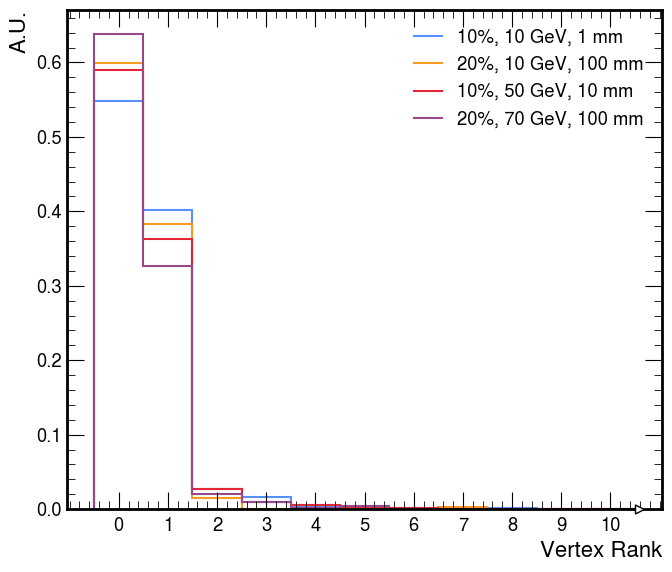

In [8]:
outD = "plots_genVars/genMatch_vtx/"
outName = "genMatched_vtx_chi2Rank"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Vertex Rank"
ylabel = "A.U."
hname = "match_vtx_chi2Rank"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlim=[None,None],xlabel=xlabel,ylabel=ylabel,rebin=1j,
             save=False,show=True,yerr=False)

## Gen-level

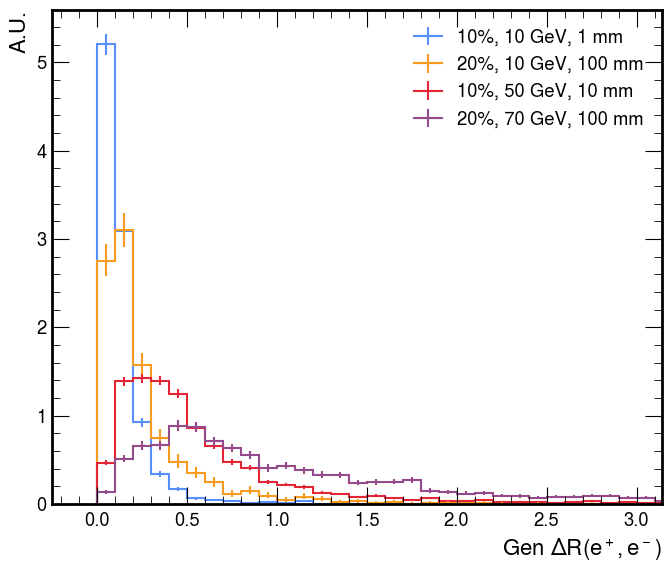

In [11]:
outD = "plots_genVars/genQuantities/"
outName = "gen_dR_selectedSignals"
selection = {"cut":"cut0"}
xlabel = "Gen $\Delta R(e^+,e^-)$"
ylabel = "A.U."
plot_samples(hcs,"gen_dR",selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlim=[None,np.pi],xlabel=xlabel,ylabel=ylabel,rebin=2j,save=True,show=True)

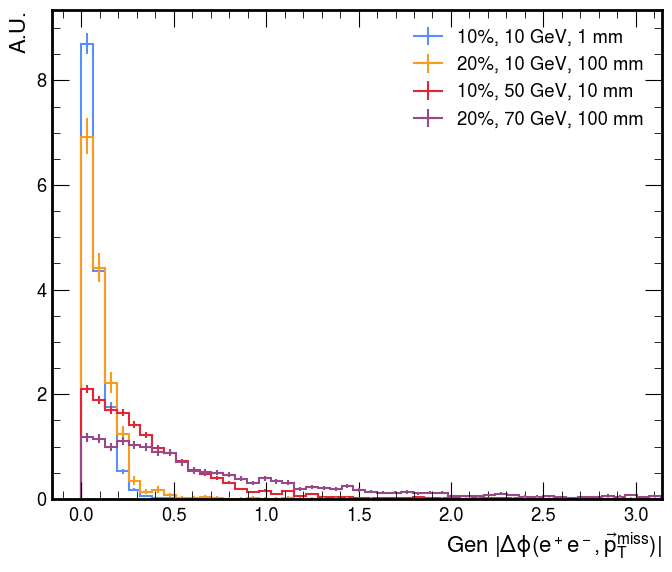

In [10]:
outD = "plots_genVars/genQuantities/"
outName = "gen_vtxMETdPhi_selectedSignals"
selection = {"cut":"cut0"}
xlabel = r"Gen $|\Delta\phi(e^+e^-,\vec{p}_T^\mathrm{miss})|$"
ylabel = "A.U."
plot_samples(hcs,"gen_vtx_METdPhi",selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlim=[None,np.pi],xlabel=xlabel,ylabel=ylabel,rebin=2j,save=True,show=True)

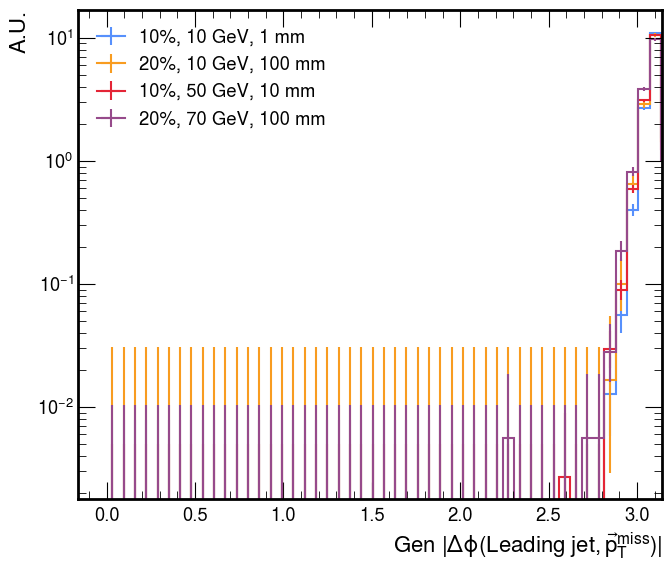

In [13]:
outD = "plots_genVars/genQuantities/"
outName = "gen_jetMETdPhi_selectedSignals"
selection = {"cut":"cut0"}
xlabel = r"Gen $|\Delta\phi(\text{Leading jet},\vec{p}_T^\mathrm{miss})|$"
ylabel = "A.U."
plot_samples(hcs,"gen_jetMETdPhi",selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlim=[None,np.pi],xlabel=xlabel,ylabel=ylabel,rebin=2j,save=True,show=True,logy=True)

## Reco event-level quantities

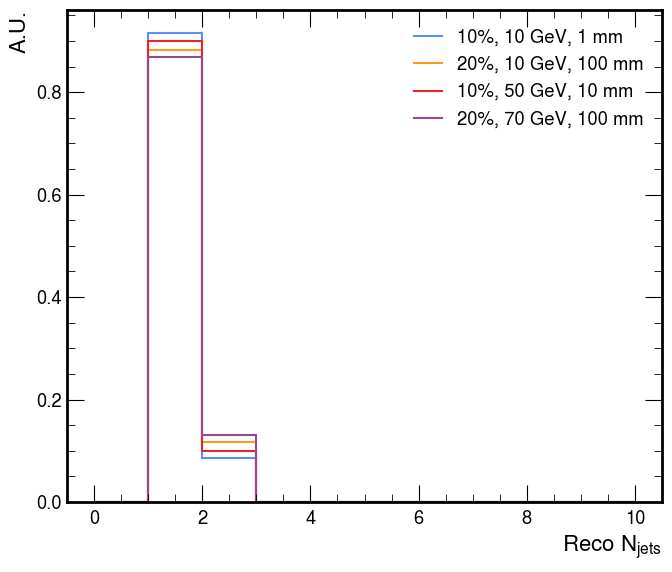

In [16]:
outD = "plots_genVars/generalPlots/"
outName = "reco_nJets_selectedSignals"
selection = {"cut":"cut0"}
xlabel = r"Reco $N_\mathrm{jets}$"
ylabel = "A.U."
plot_samples(hcs,"nJets",selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlim=[None,None],xlabel=xlabel,ylabel=ylabel,rebin=1j,save=True,show=True,logy=False,yerr=False)

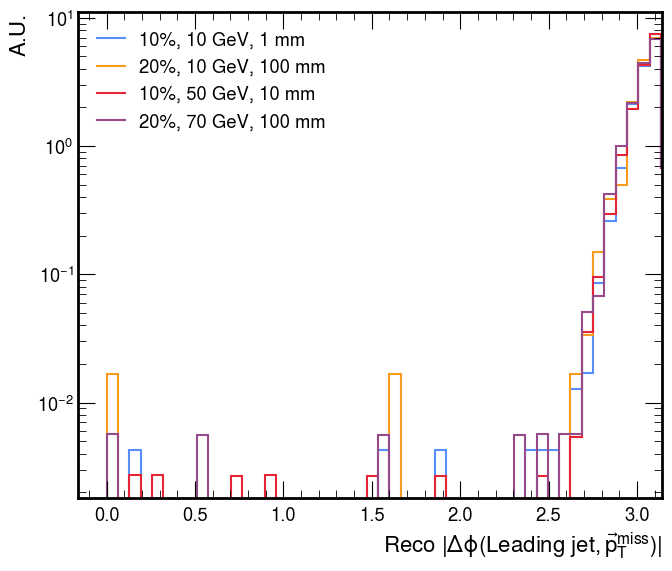

In [17]:
outD = "plots_genVars/generalPlots/"
outName = "reco_jetMETdPhi_selectedSignals"
selection = {"cut":"cut0"}
xlabel = r"Reco $|\Delta\phi(\text{Leading jet},\vec{p}_T^\mathrm{miss})|$"
ylabel = "A.U."
plot_samples(hcs,"jetMETdPhi",selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlim=[None,np.pi],xlabel=xlabel,ylabel=ylabel,rebin=2j,save=True,show=True,yerr=False,logy=True)

## Gen-matched vertices

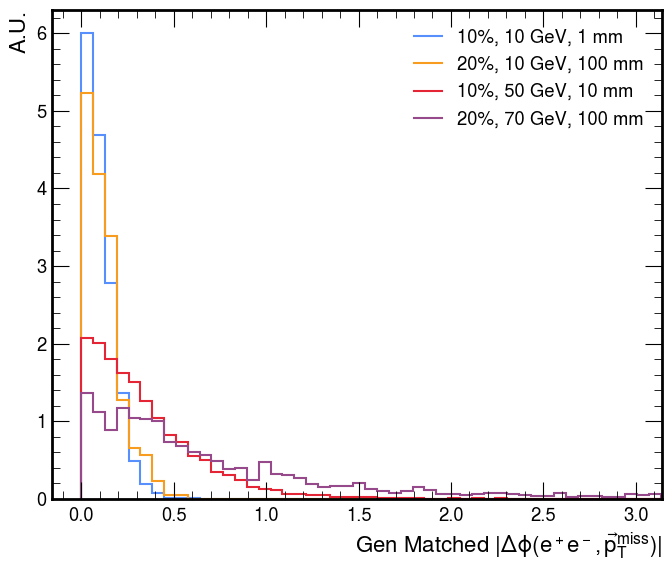

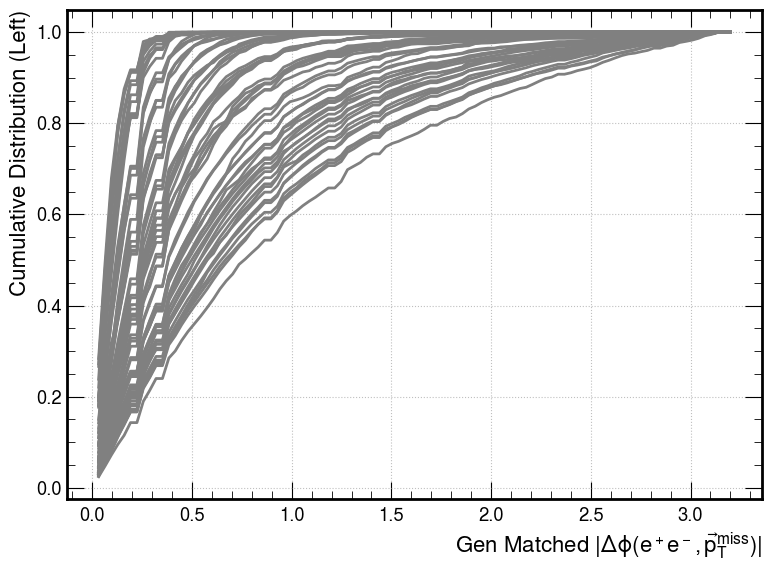

In [34]:
outD = "plots_genVars/genMatch_vtx/"
outName = "genMatched_vtxMETdPhi_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Gen Matched $|\Delta\phi(e^+e^-,\vec{p}_T^\mathrm{miss})|$"
ylabel = "A.U."
hname = "match_vtx_METdPhi"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlim=[None,np.pi],xlabel=xlabel,ylabel=ylabel,rebin=2j,save=True,show=True,yerr=False)
outD = "plots_genVars/genMatch_vtx_cdfs/"
outName = "genMatched_cdf_vtxMETdPhi_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=False)

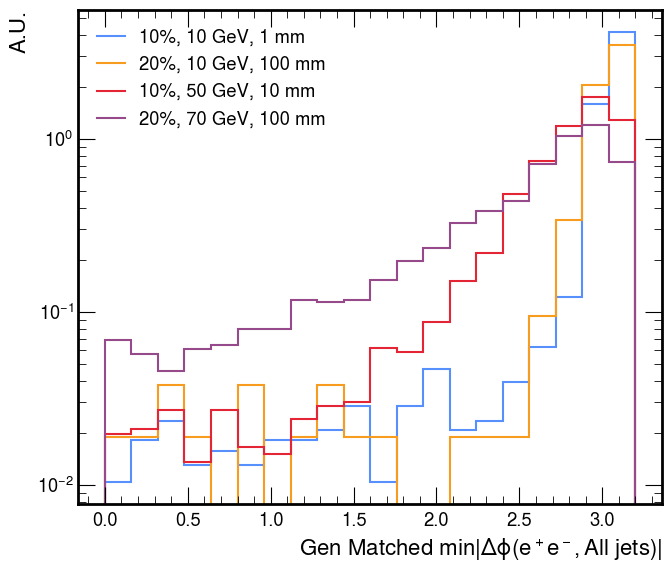

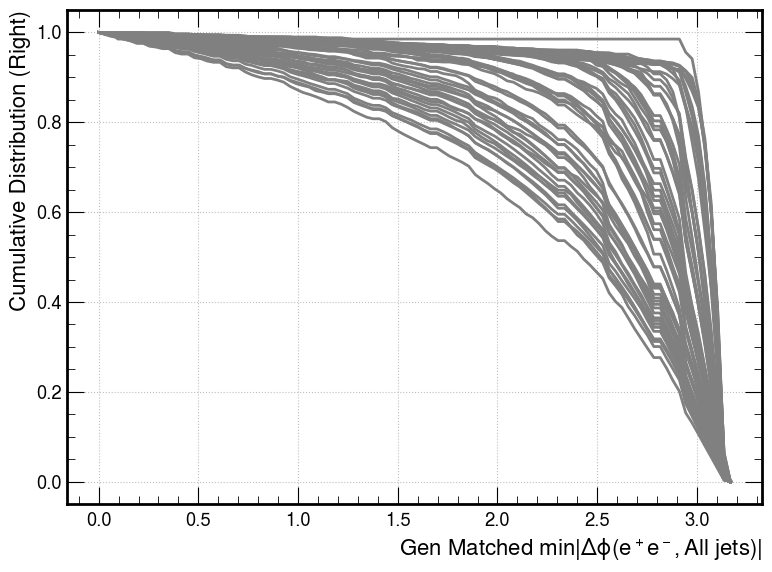

In [35]:
outD = "plots_genVars/genMatch_vtx/"
outName = "genMatched_minJetMETdPhi_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Gen Matched $\min |\Delta\phi(e^+e^-,\text{All jets})|$"
ylabel = "A.U."
hname = "match_vtx_mindPhiJ"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlim=[None,None],xlabel=xlabel,ylabel=ylabel,rebin=5j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/genMatch_vtx_cdfs/"
outName = "genMatched_cdf_minJetMETdPhi_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True)

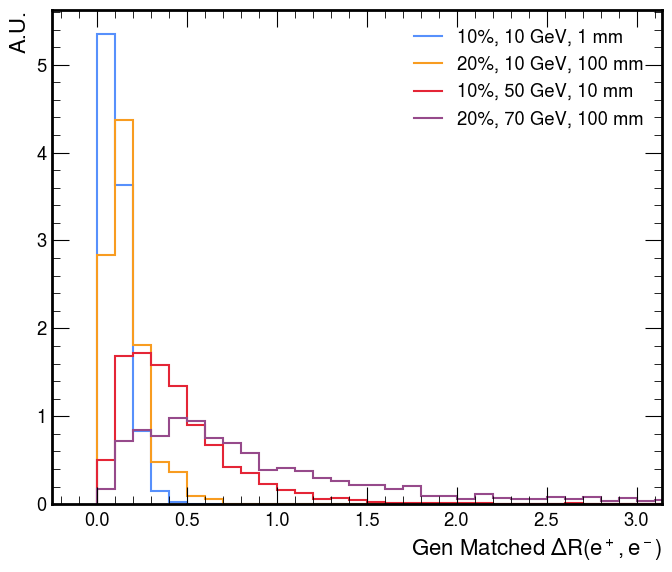

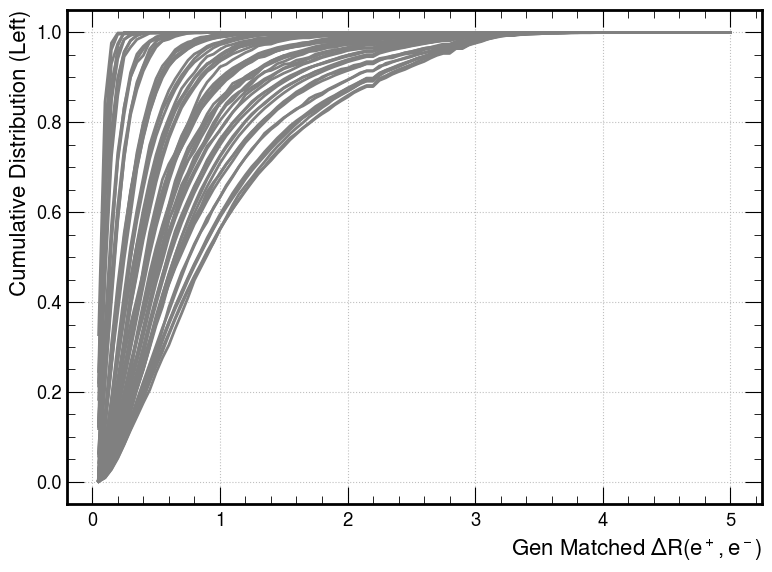

In [36]:
outD = "plots_genVars/genMatch_vtx/"
outName = "genMatched_vtx_dR_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Gen Matched $\Delta R(e^+,e^-)$"
ylabel = "A.U."
hname = "match_vtx_dR"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlim=[None,np.pi],xlabel=xlabel,ylabel=ylabel,rebin=2j,save=True,show=True,yerr=False)
outD = "plots_genVars/genMatch_vtx_cdfs/"
outName = "genMatched_cdf_vtx_dR_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=False)

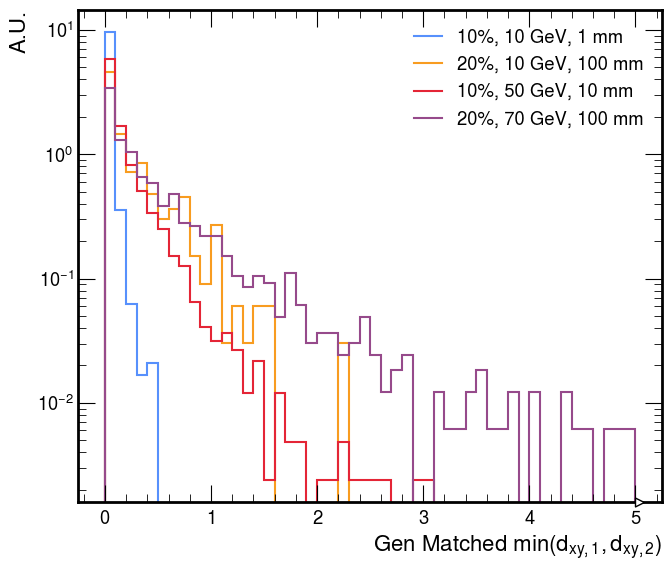

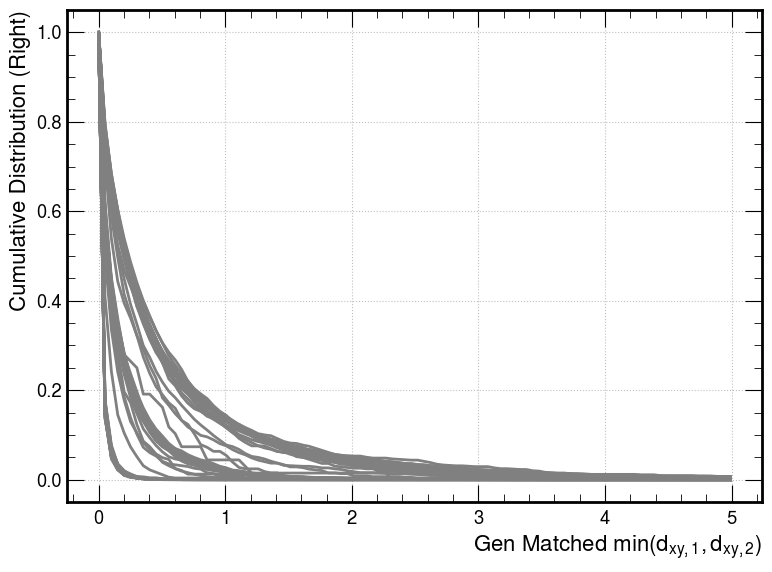

In [37]:
outD = "plots_genVars/genMatch_vtx/"
outName = "genMatched_vtx_minDxy_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Gen Matched $\min(d_{xy,1},d_{xy,2})$"
ylabel = "A.U."
hname = "match_vtx_mindxy"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=10j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/genMatch_vtx_cdfs/"
outName = "genMatched_cdf_vtx_minDxy_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

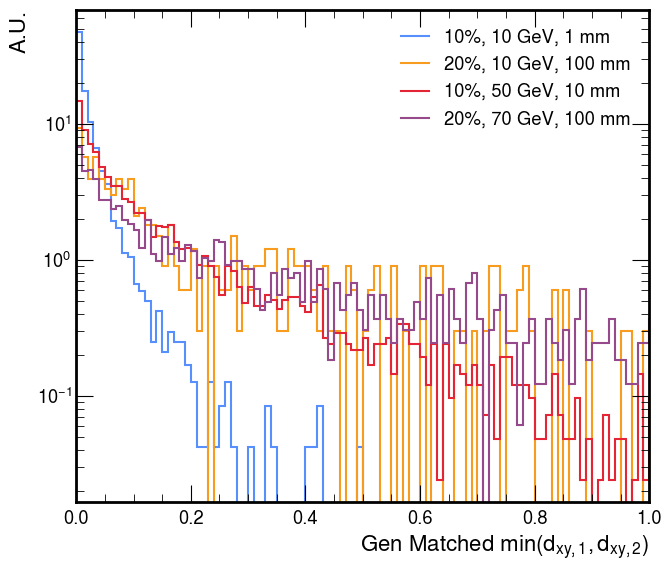

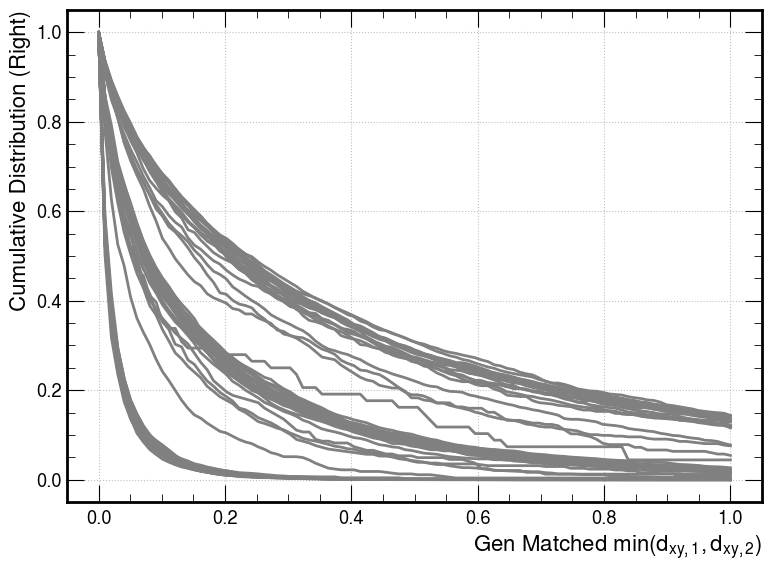

In [38]:
outD = "plots_genVars/genMatch_vtx/"
outName = "genMatched_vtx_minDxyZoom_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Gen Matched $\min(d_{xy,1},d_{xy,2})$"
ylabel = "A.U."
hname = "match_vtx_mindxy"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlim=[0,1],xlabel=xlabel,ylabel=ylabel,rebin=1j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/genMatch_vtx_cdfs/"
outName = "genMatched_cdf_vtx_minDxyZoom_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlim=[0,1],xlabel=xlabel,save=True,show=True,right=True)

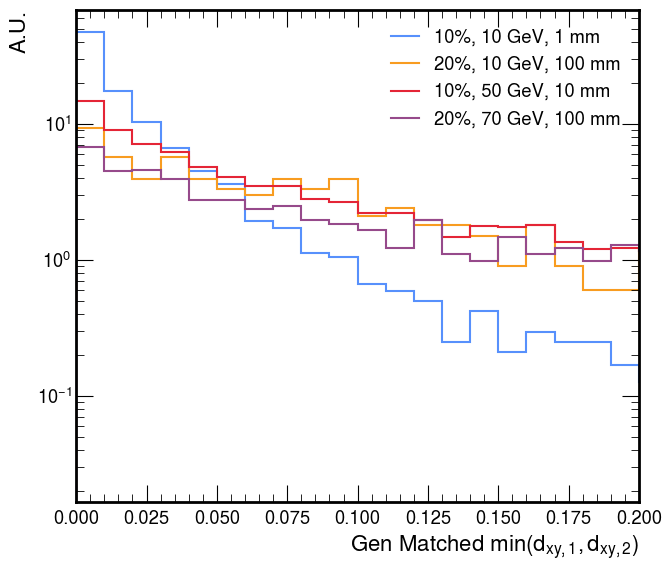

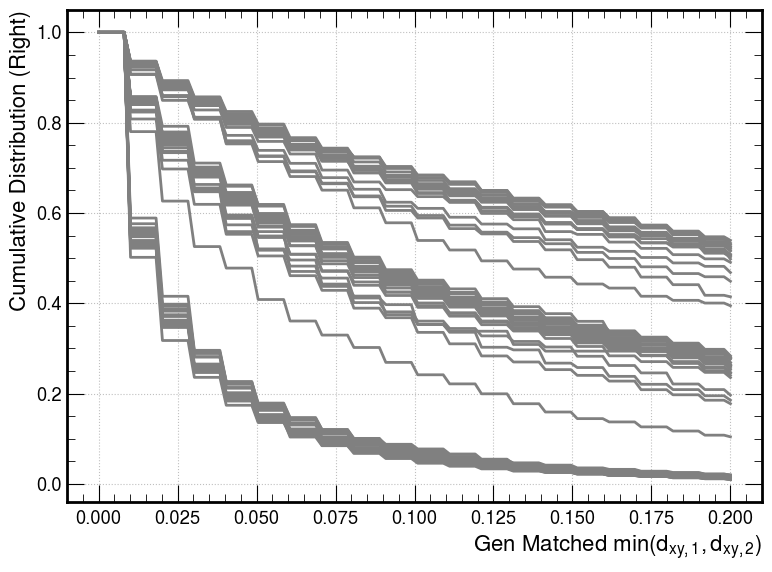

In [39]:
outD = "plots_genVars/genMatch_vtx/"
outName = "genMatched_vtx_minDxyZoomZoom_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Gen Matched $\min(d_{xy,1},d_{xy,2})$"
ylabel = "A.U."
hname = "match_vtx_mindxy"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlim=[0,0.2],xlabel=xlabel,ylabel=ylabel,rebin=1j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/genMatch_vtx_cdfs/"
outName = "genMatched_cdf_vtx_minDxyZoomZoom_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlim=[0,0.2],xlabel=xlabel,save=True,show=True,right=True)

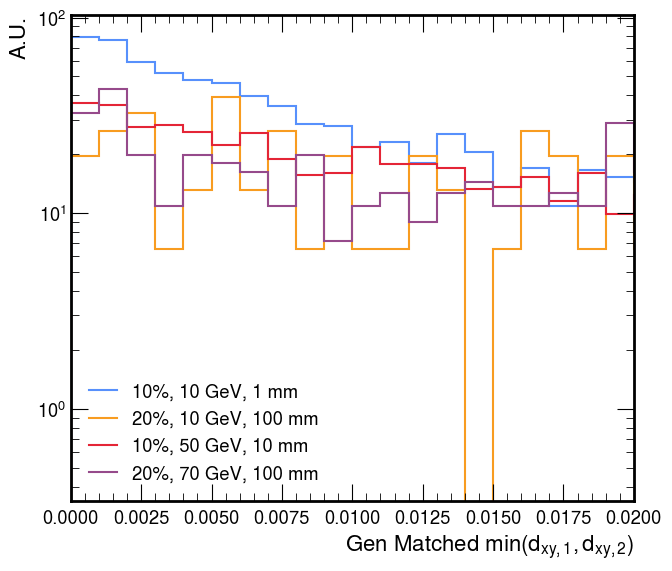

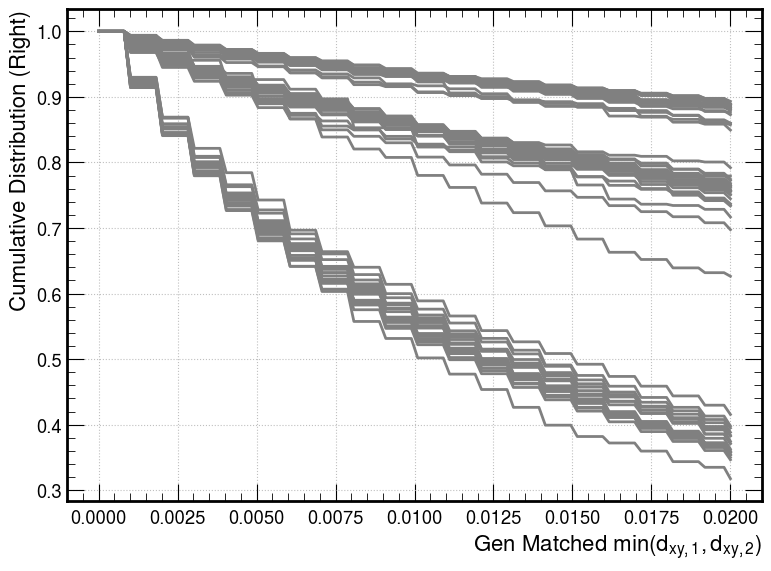

In [40]:
outD = "plots_genVars/genMatch_vtx/"
outName = "genMatched_vtx_minDxy_low_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Gen Matched $\min(d_{xy,1},d_{xy,2})$"
ylabel = "A.U."
hname = "match_vtx_mindxy_low"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlim=[0,0.02],xlabel=xlabel,ylabel=ylabel,rebin=1j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/genMatch_vtx_cdfs/"
outName = "genMatched_cdf_vtx_minDxy_low_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlim=[0,0.02],xlabel=xlabel,save=True,show=True,right=True)

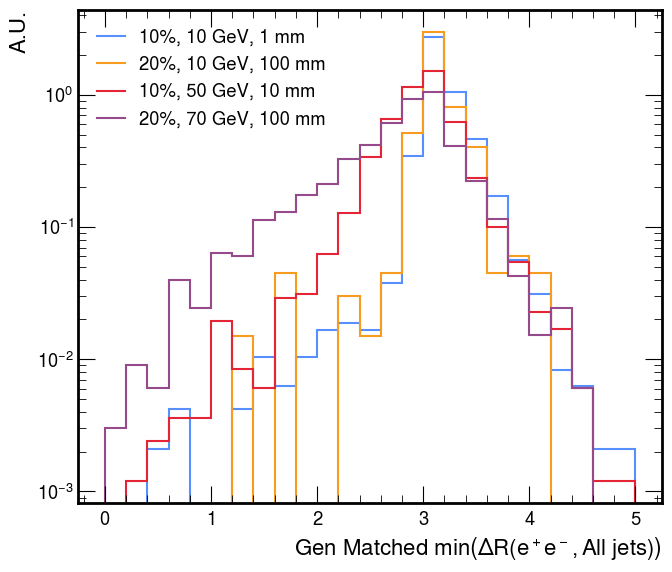

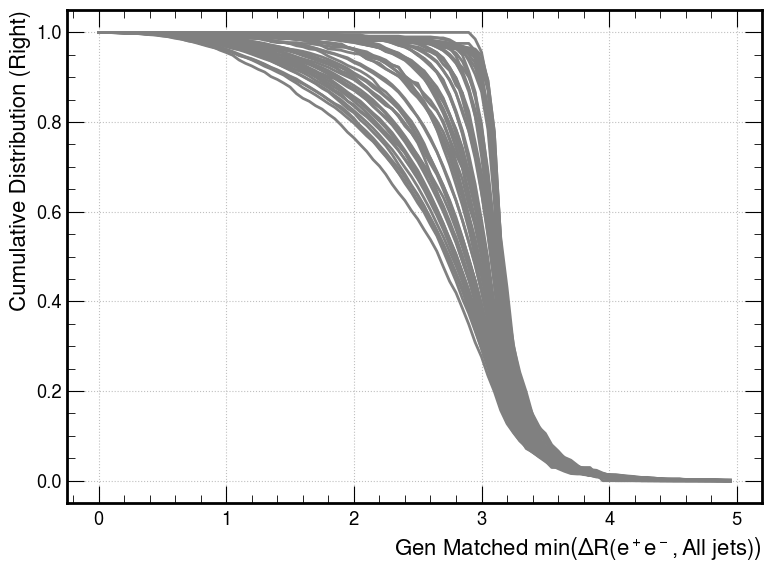

In [41]:
outD = "plots_genVars/genMatch_vtx/"
outName = "genMatched_vtx_mindRj_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Gen Matched $\min \left(\Delta R(e^+e^-,\text{All jets})\right)$"
ylabel = "A.U."
hname = "match_vtx_mindRj"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=4j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/genMatch_vtx_cdfs/"
outName = "genMatched_cdf_vtx_mindRj_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

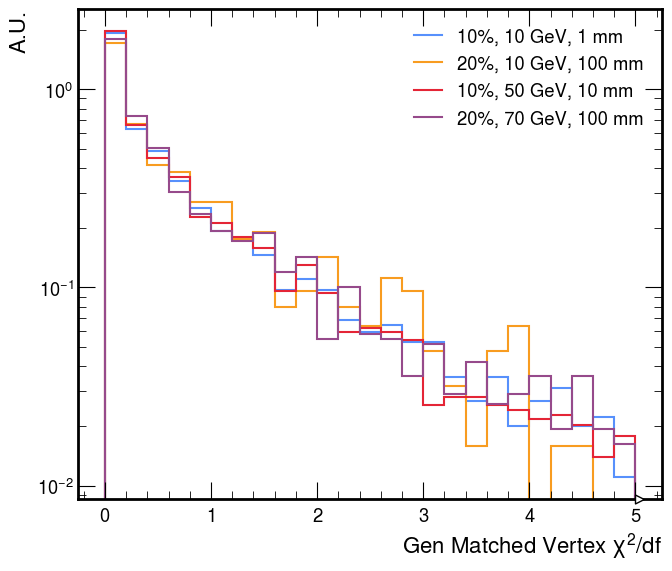

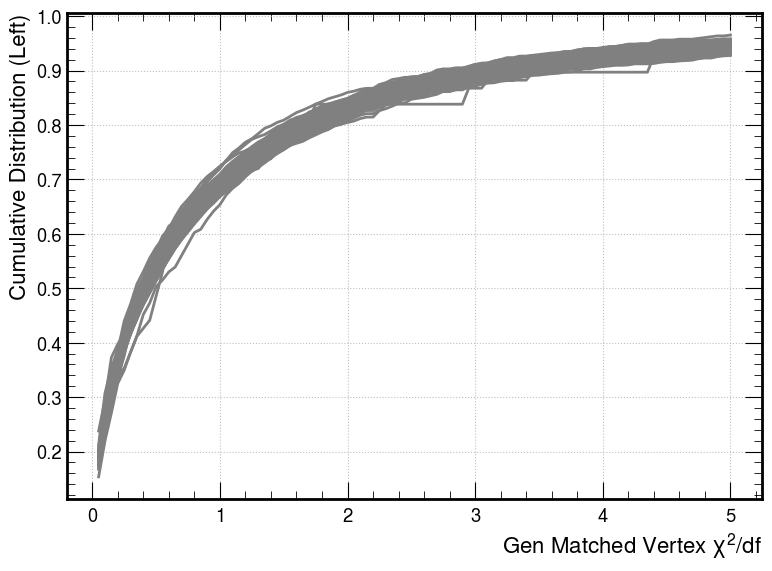

In [42]:
outD = "plots_genVars/genMatch_vtx/"
outName = "genMatched_vtx_chi2_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Gen Matched Vertex $\chi^2/df$"
ylabel = "A.U."
hname = "match_vtx_chi2"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=4j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/genMatch_vtx_cdfs/"
outName = "genMatched_cdf_vtx_chi2_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=False)

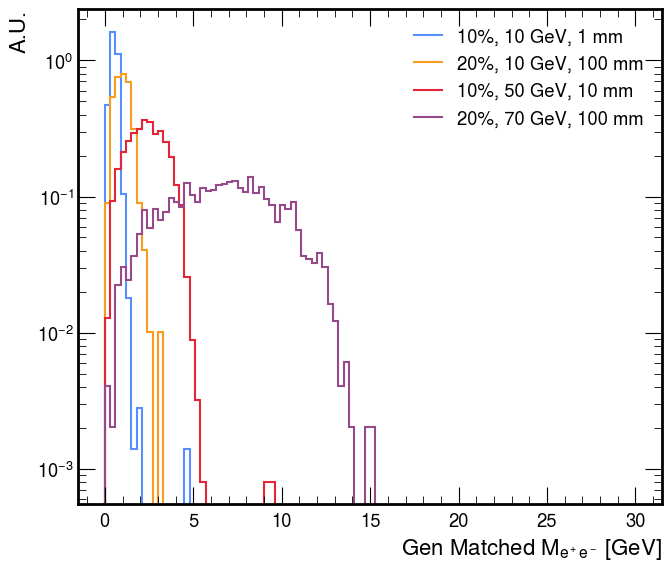

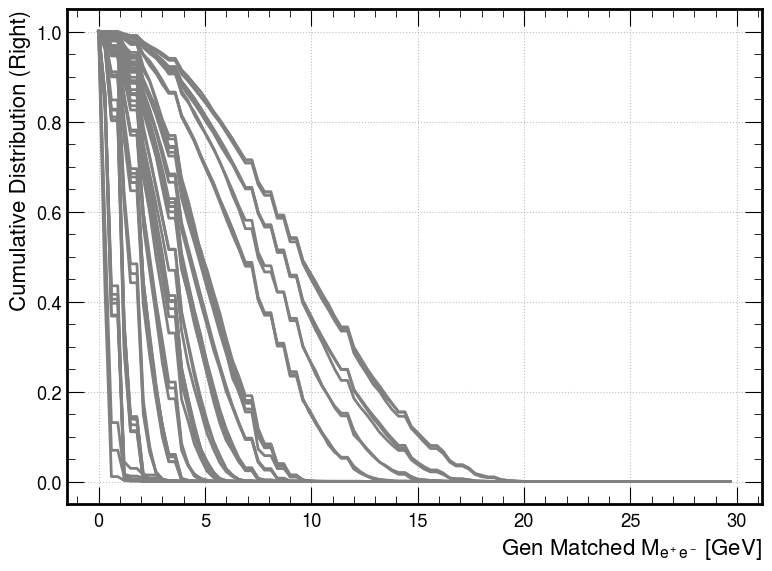

In [43]:
outD = "plots_genVars/genMatch_vtx/"
outName = "genMatched_vtx_mass_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Gen Matched $M_{e^+e^-}$ [GeV]"
ylabel = "A.U."
hname = "match_vtx_mass"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=1j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/genMatch_vtx_cdfs/"
outName = "genMatched_cdf_vtx_mass_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

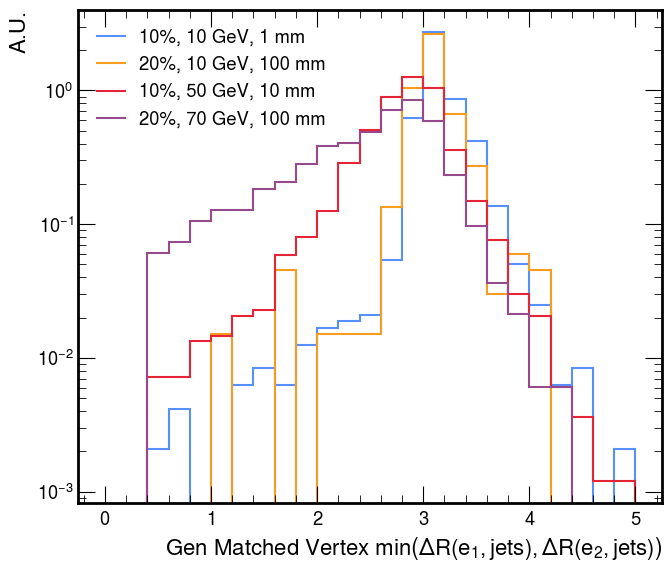

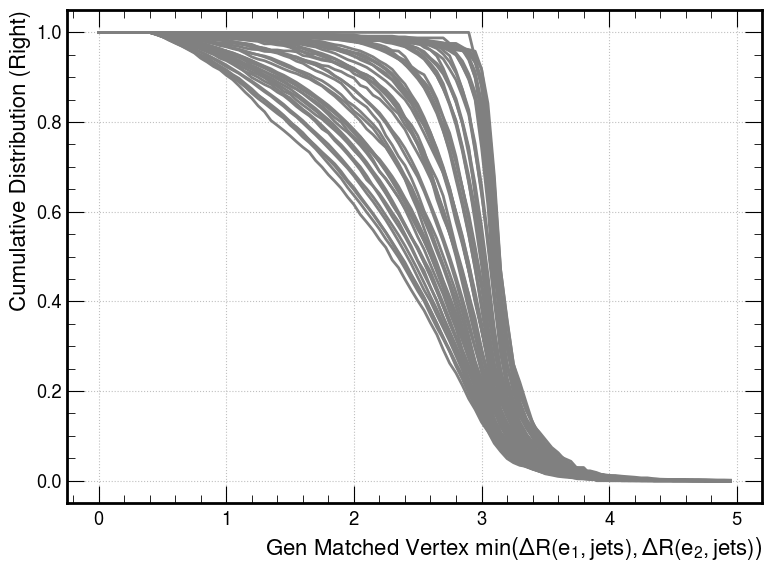

In [44]:
outD = "plots_genVars/genMatch_vtx/"
outName = "genMatched_vtx_minEleDrJ_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Gen Matched Vertex $\min\left(\Delta R(e_1,\text{jets}),\Delta R(e_2,\text{jets})\right)$"
ylabel = "A.U."
hname = "match_vtx_minEleDrJ"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=4j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/genMatch_vtx_cdfs/"
outName = "genMatched_cdf_vtx_minEleDrJ_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

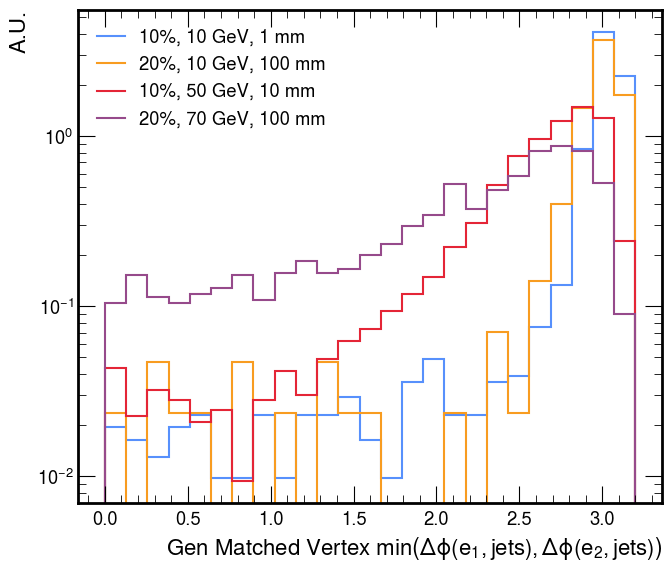

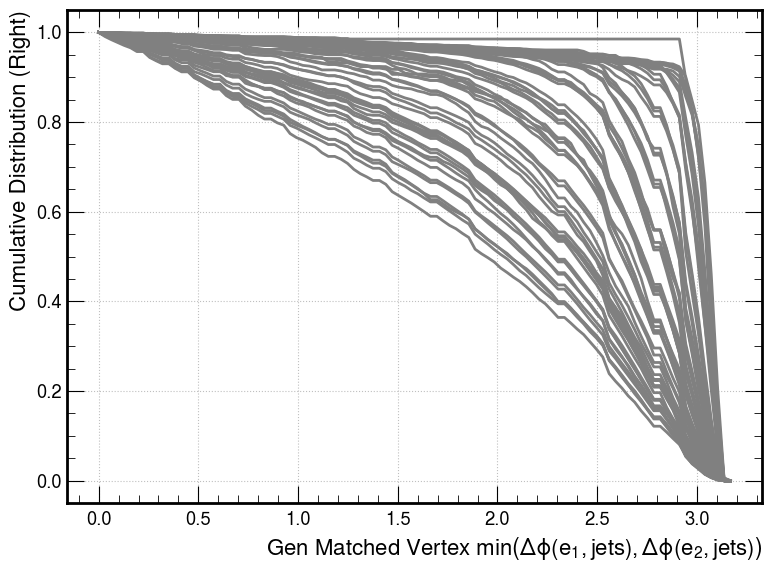

In [45]:
outD = "plots_genVars/genMatch_vtx/"
outName = "genMatched_vtx_minEleDPhiJ_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Gen Matched Vertex $\min\left(\Delta \phi(e_1,\text{jets}),\Delta \phi(e_2,\text{jets})\right)$"
ylabel = "A.U."
hname = "match_vtx_minEleDPhiJ"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=4j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/genMatch_vtx_cdfs/"
outName = "genMatched_cdf_vtx_minEleDPhiJ_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

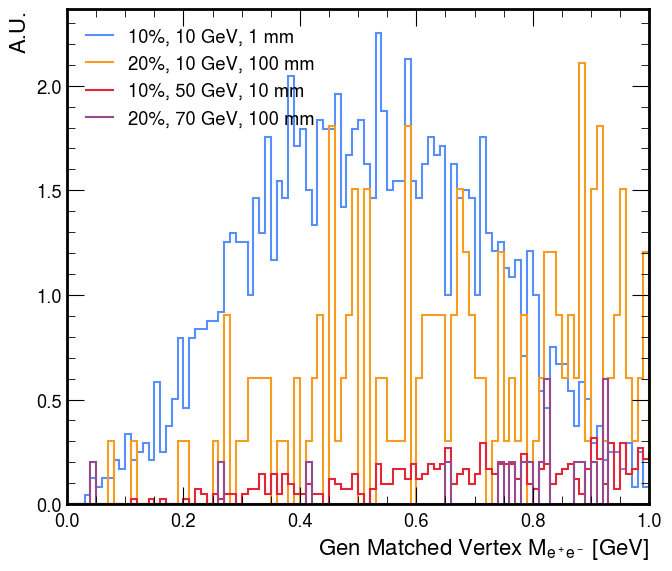

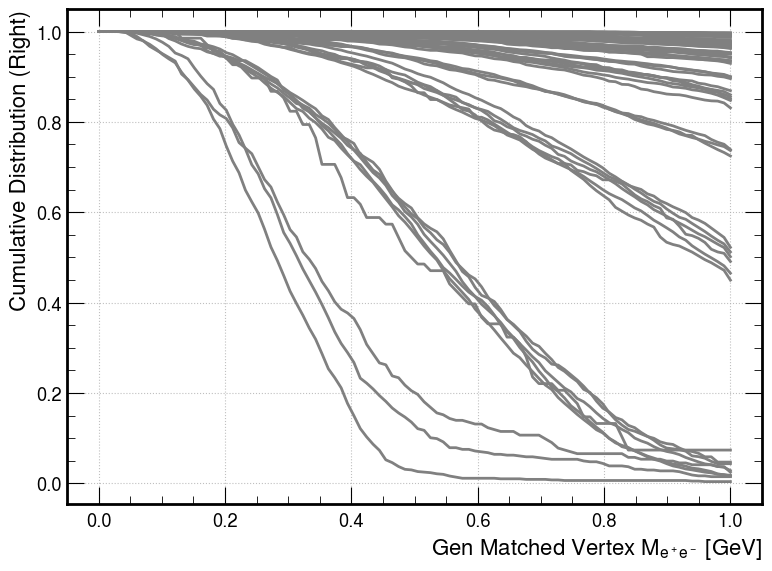

In [46]:
outD = "plots_genVars/genMatch_vtx/"
outName = "genMatched_vtx_mass_low_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Gen Matched Vertex $M_{e^+e^-}$ [GeV]"
ylabel = "A.U."
hname = "match_vtx_mass_low"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=1j,save=True,show=True,logy=False,yerr=False,
            xlim=[0,1])
outD = "plots_genVars/genMatch_vtx_cdfs/"
outName = "genMatched_cdf_vtx_mass_low_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,xlim=[0,1],save=True,show=True,right=True)

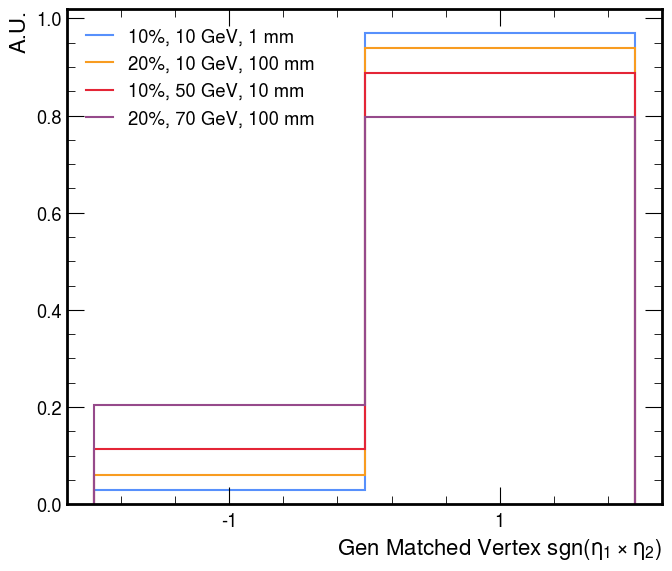

In [47]:
outD = "plots_genVars/genMatch_vtx/"
outName = "genMatched_vtx_signEtaProd_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Gen Matched Vertex $\mathrm{sgn}(\eta_1\times\eta_2)$"
ylabel = "A.U."
hname = "match_vtx_sign_etaProd"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=1j,save=True,show=True,logy=False,yerr=False)

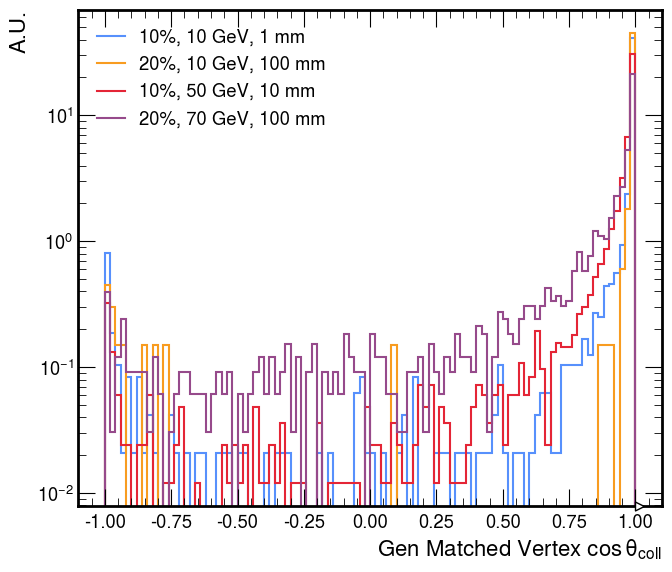

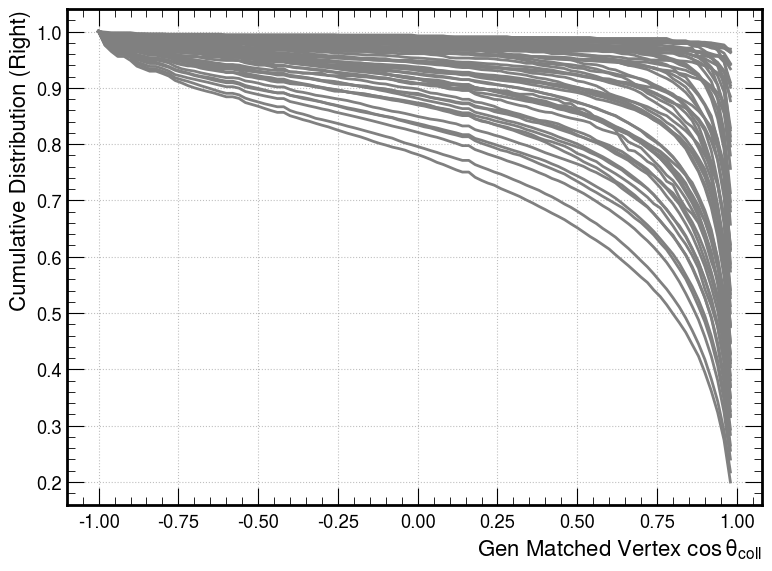

In [48]:
outD = "plots_genVars/genMatch_vtx/"
outName = "genMatched_vtx_cosThetaColl_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Gen Matched Vertex $\cos \theta_\mathrm{coll}$"
ylabel = "A.U."
hname = "match_vtx_CosThetaColl"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=1j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/genMatch_vtx_cdfs/"
outName = "genMatched_cdf_vtx_cosThetaColl_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

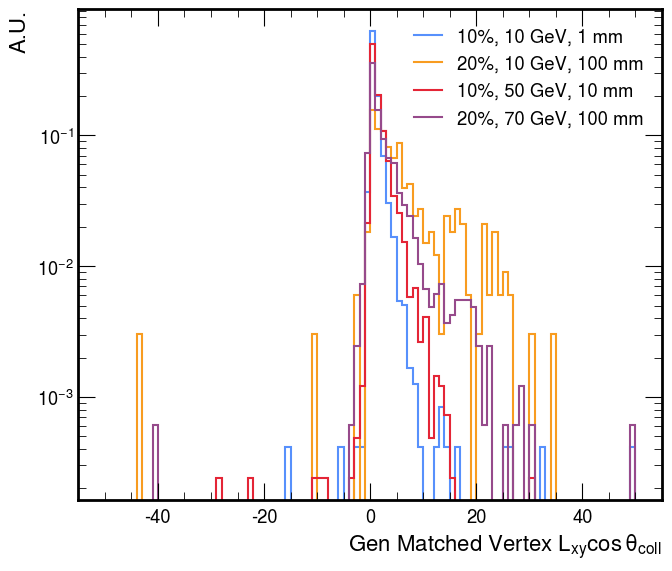

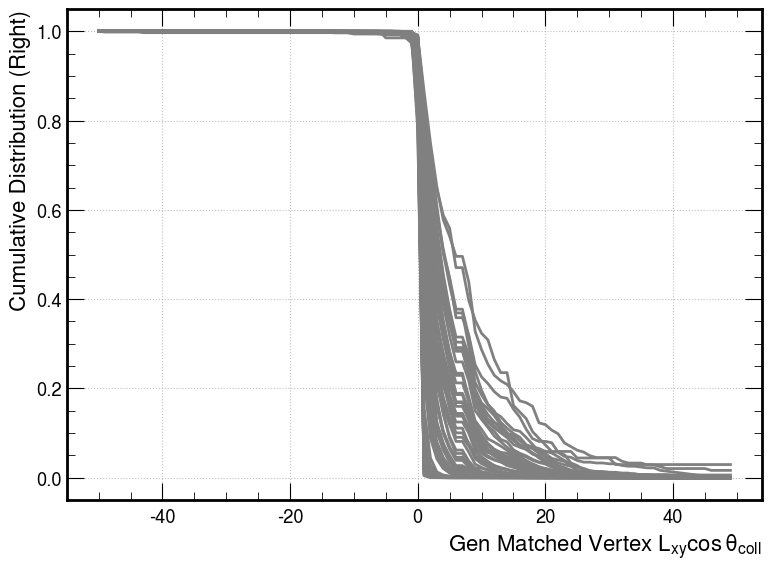

In [49]:
outD = "plots_genVars/genMatch_vtx/"
outName = "genMatched_vtx_LxyCosThetaColl_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Gen Matched Vertex $L_{xy}\cos \theta_\mathrm{coll}$"
ylabel = "A.U."
hname = "match_vtx_LxyCosThetaColl"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=1j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/genMatch_vtx_cdfs/"
outName = "genMatched_cdf_vtx_LxyCosThetaColl_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

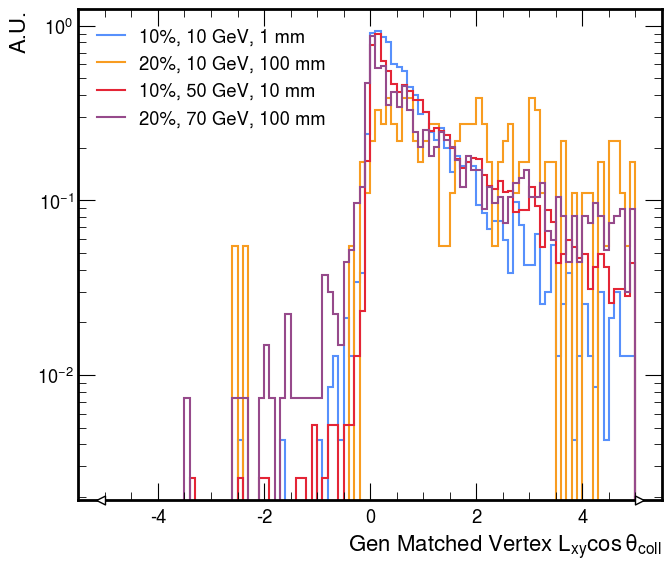

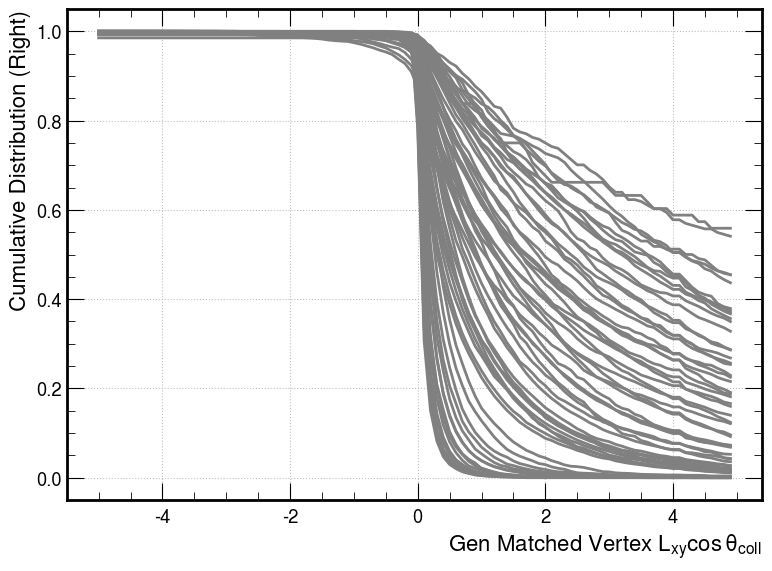

In [7]:
outD = "plots_genVars/genMatch_vtx/"
outName = "genMatched_vtx_LxyCosThetaCollZoom_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Gen Matched Vertex $L_{xy}\cos \theta_\mathrm{coll}$"
ylabel = "A.U."
hname = "match_vtx_LxyCosThetaCollZoom"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=1j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/genMatch_vtx_cdfs/"
outName = "genMatched_cdf_vtx_LxyCosThetaCollZoom_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

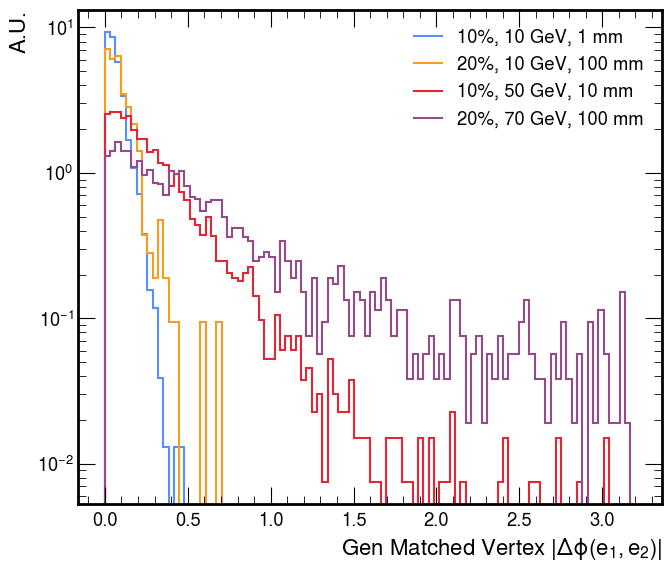

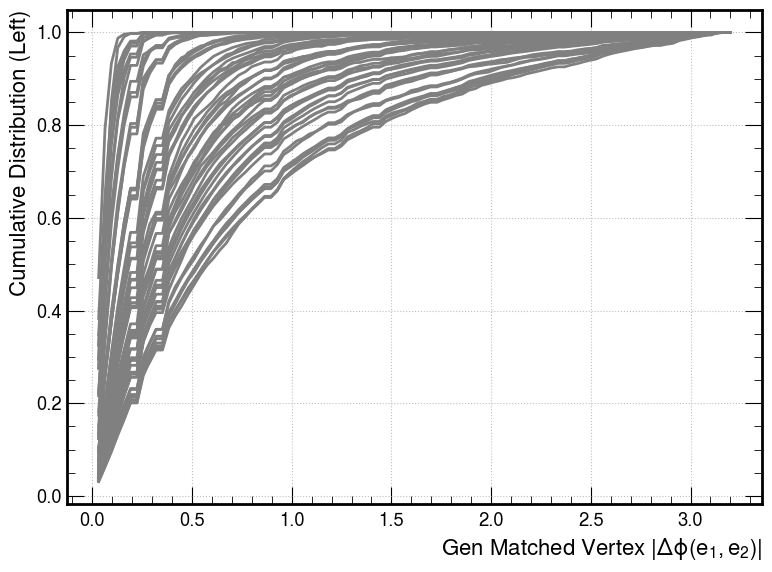

In [50]:
outD = "plots_genVars/genMatch_vtx/"
outName = "genMatched_vtx_eleDphi_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Gen Matched Vertex $|\Delta \phi(e_1,e_2)|$"
ylabel = "A.U."
hname = "match_vtx_eleDphi"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=1j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/genMatch_vtx_cdfs/"
outName = "genMatched_cdf_vtx_eleDphi_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=False)

## Gen-matched electrons

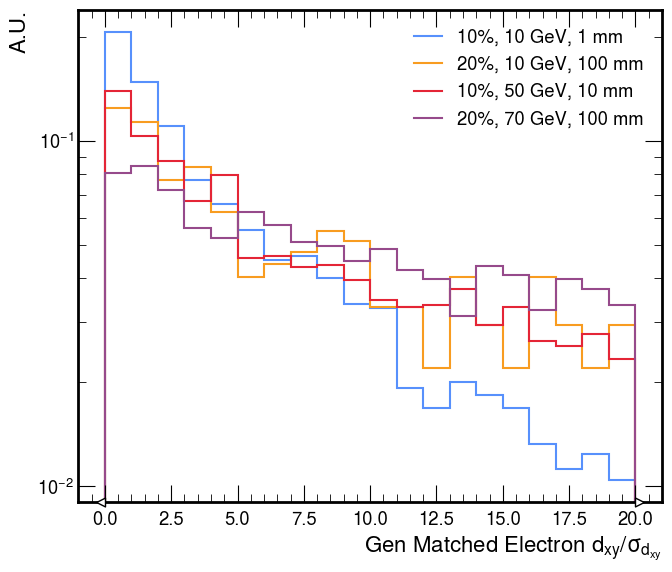

In [19]:
outD = "plots_genVars/genMatch_ele/"
outName = "genMatched_ele_dxySignif_selectedSignals"
selection = {"cut":"cut0","match_type":sum}
xlabel = r"Gen Matched Electron $d_{xy}/\sigma_{d_{xy}}$"
ylabel = "A.U."
plot_samples(hcs,"match_ele_dxySignif",selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=5j,save=True,show=True,logy=True,yerr=False)

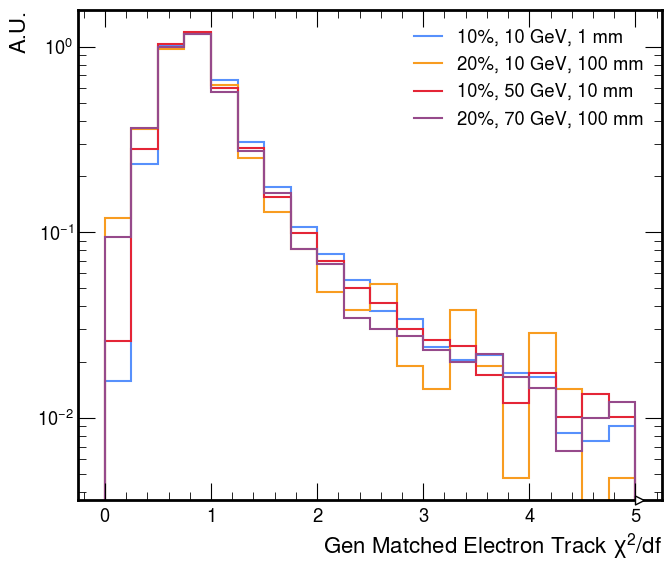

In [20]:
outD = "plots_genVars/genMatch_ele/"
outName = "genMatched_ele_trkChi2_selectedSignals"
selection = {"cut":"cut0","match_type":sum}
xlabel = r"Gen Matched Electron Track $\chi^2/df$"
ylabel = "A.U."
plot_samples(hcs,"match_ele_trkChi2",selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=5j,save=True,show=True,logy=True,yerr=False)

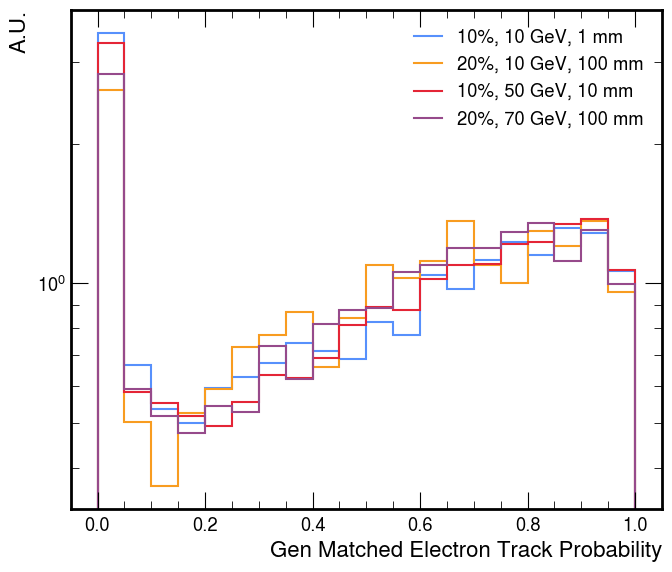

In [21]:
outD = "plots_genVars/genMatch_ele/"
outName = "genMatched_ele_trkProb_selectedSignals"
selection = {"cut":"cut0","match_type":sum}
xlabel = r"Gen Matched Electron Track Probability"
ylabel = "A.U."
plot_samples(hcs,"match_ele_trkProb",selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=5j,save=True,show=True,logy=True,yerr=False)

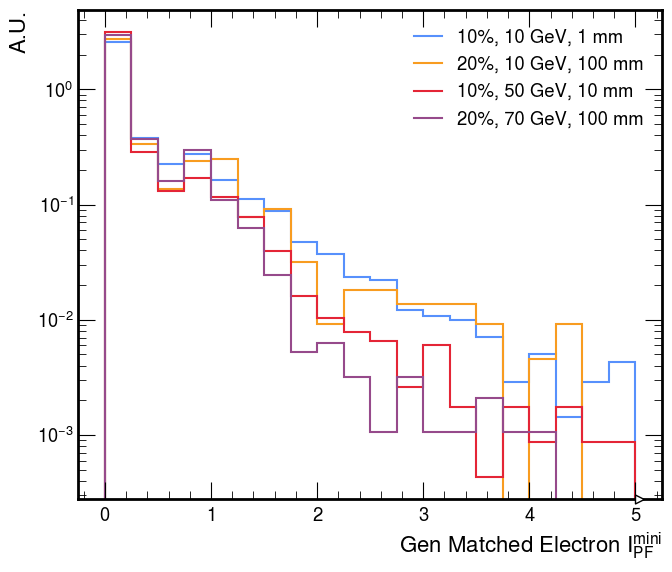

In [22]:
outD = "plots_genVars/genMatch_ele/"
outName = "genMatched_ele_miniRelIso_selectedSignals"
selection = {"cut":"cut0","match_type":sum}
xlabel = r"Gen Matched Electron $I_\mathrm{PF}^\mathrm{mini}$"
ylabel = "A.U."
plot_samples(hcs,"match_ele_miniRelIso",selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=5j,save=True,show=True,logy=True,yerr=False)

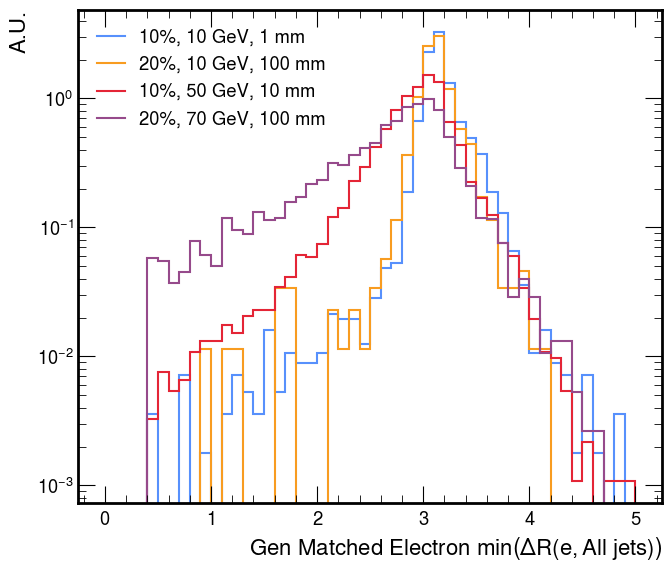

In [25]:
outD = "plots_genVars/genMatch_ele/"
outName = "genMatched_ele_mindRJets_selectedSignals"
selection = {"cut":"cut0","match_type":sum}
xlabel = r"Gen Matched Electron $\min\left(\Delta R(e,\text{All jets})\right)$"
ylabel = "A.U."
plot_samples(hcs,"match_ele_mindRJets",selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=2j,save=True,show=True,logy=True,yerr=False)

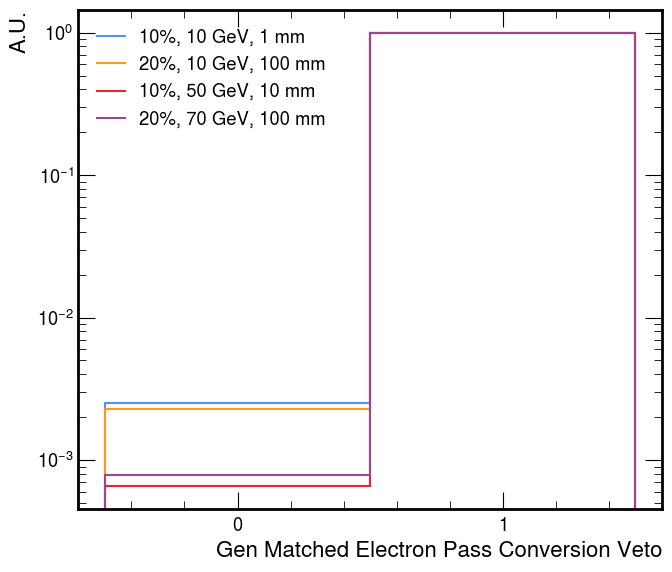

In [26]:
outD = "plots_genVars/genMatch_ele/"
outName = "genMatched_ele_passConvVeto_selectedSignals"
selection = {"cut":"cut0","match_type":sum}
xlabel = r"Gen Matched Electron Pass Conversion Veto"
ylabel = "A.U."
plot_samples(hcs,"match_ele_passConvVeto",selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=1j,save=True,show=True,logy=True,yerr=False)

# Fake vertices

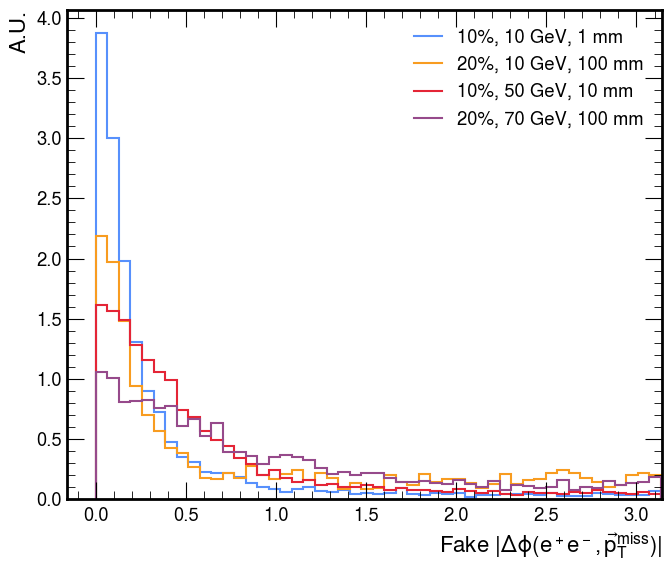

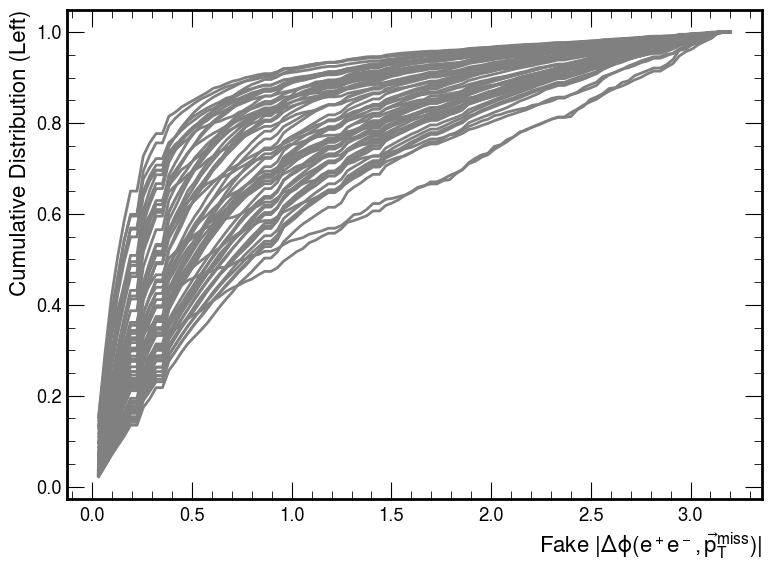

In [15]:
outD = "plots_genVars/fake_vtx/"
outName = "fake_vtxMETdPhi_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake $|\Delta\phi(e^+e^-,\vec{p}_T^\mathrm{miss})|$"
ylabel = "A.U."
hname = "fake_vtx_METdPhi"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlim=[None,np.pi],xlabel=xlabel,ylabel=ylabel,rebin=2j,save=True,show=True,yerr=False)
outD = "plots_genVars/genMatch_vtx_cdfs/"
outName = "fake_cdf_vtxMETdPhi_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=False)

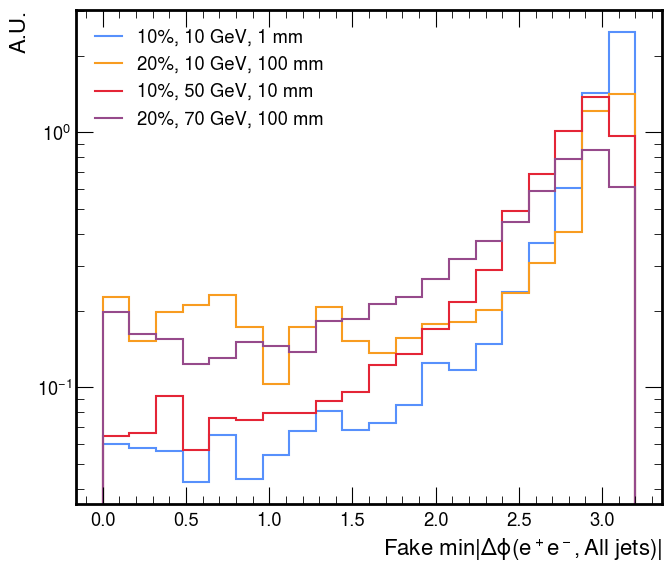

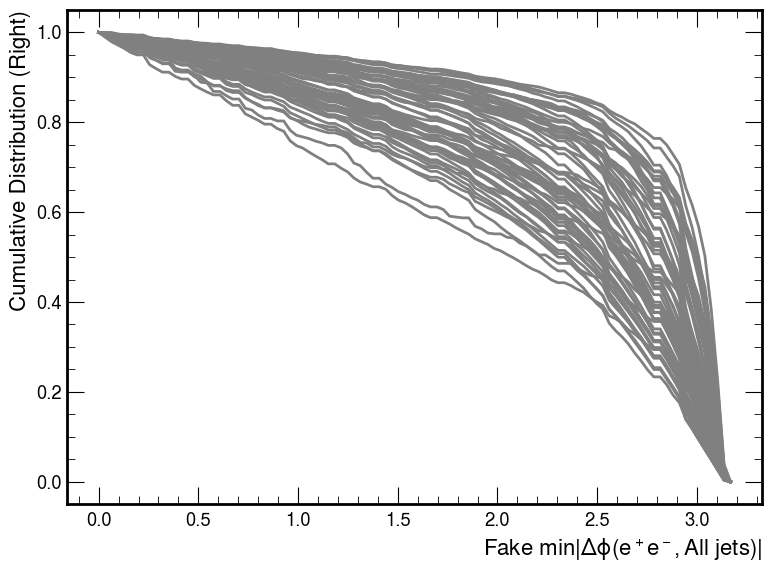

In [16]:
outD = "plots_genVars/fake_vtx/"
outName = "fake_minJetMETdPhi_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake $\min |\Delta\phi(e^+e^-,\text{All jets})|$"
ylabel = "A.U."
hname = "fake_vtx_mindPhiJ"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlim=[None,None],xlabel=xlabel,ylabel=ylabel,rebin=5j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/fake_vtx_cdfs/"
outName = "fake_cdf_minJetMETdPhi_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True)

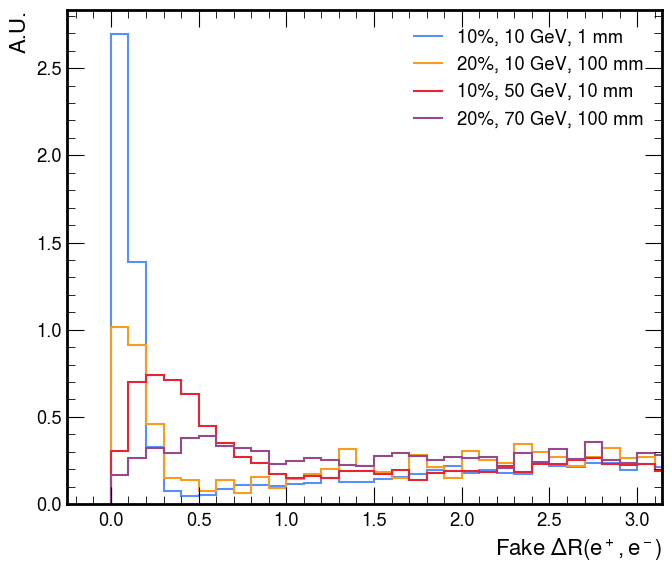

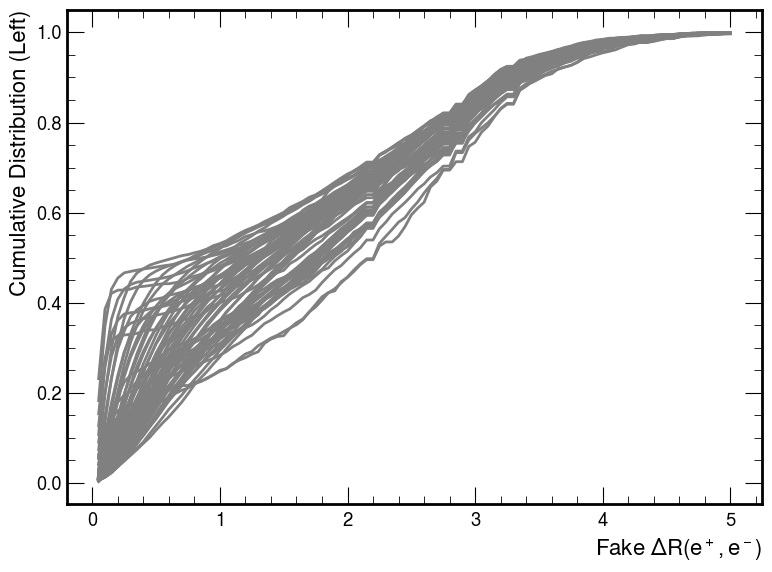

In [17]:
outD = "plots_genVars/fake_vtx/"
outName = "fake_vtx_dR_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake $\Delta R(e^+,e^-)$"
ylabel = "A.U."
hname = "fake_vtx_dR"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlim=[None,np.pi],xlabel=xlabel,ylabel=ylabel,rebin=2j,save=True,show=True,yerr=False)
outD = "plots_genVars/fake_vtx_cdfs/"
outName = "fake_cdf_vtx_dR_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=False)

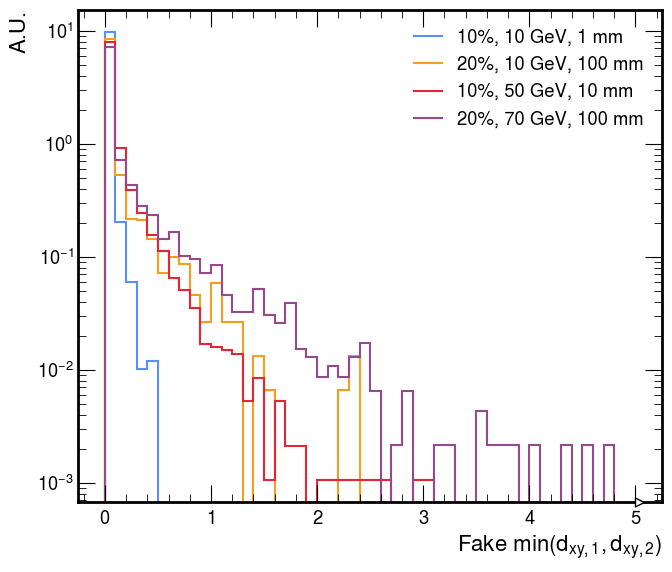

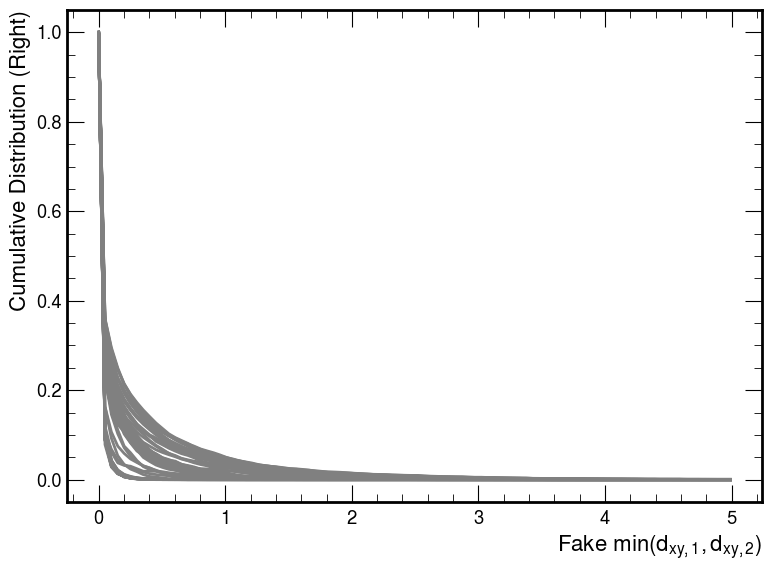

In [19]:
outD = "plots_genVars/fake_vtx/"
outName = "fake_vtx_minDxy_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake $\min(d_{xy,1},d_{xy,2})$"
ylabel = "A.U."
hname = "fake_vtx_mindxy"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=10j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/fake_vtx_cdfs/"
outName = "fake_cdf_vtx_minDxy_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

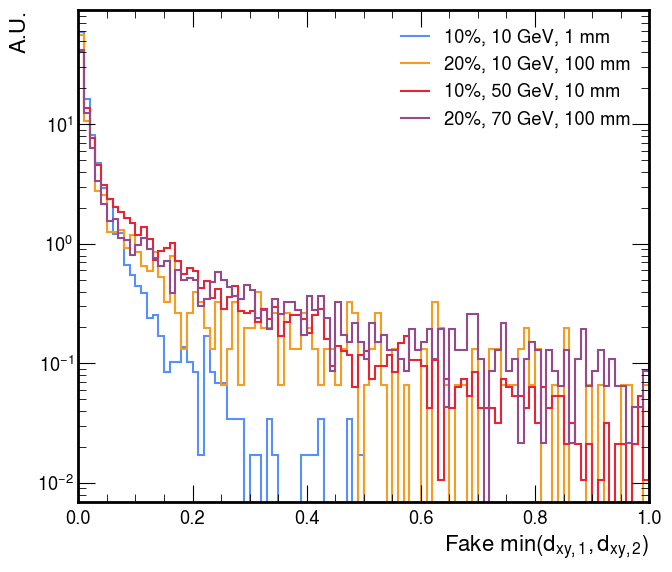

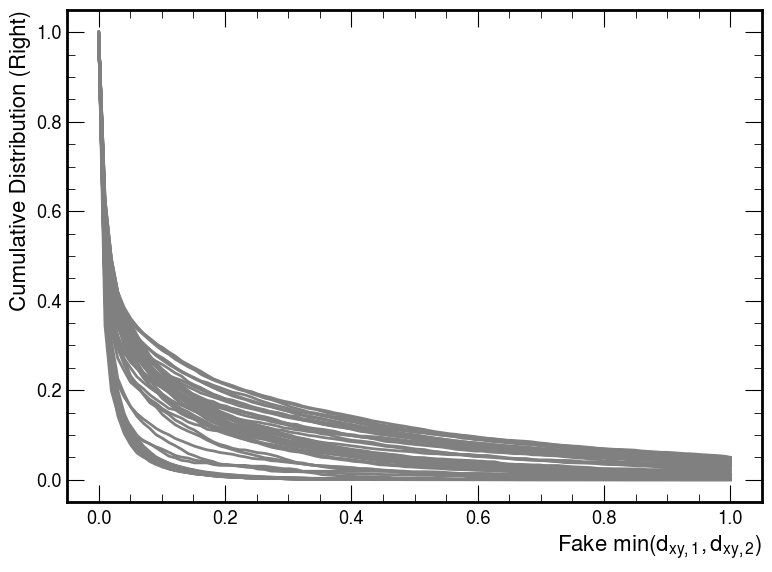

In [20]:
outD = "plots_genVars/fake_vtx/"
outName = "fake_vtx_minDxyZoom_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake $\min(d_{xy,1},d_{xy,2})$"
ylabel = "A.U."
hname = "fake_vtx_mindxy"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlim=[0,1],xlabel=xlabel,ylabel=ylabel,rebin=1j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/fake_vtx_cdfs/"
outName = "fake_cdf_vtx_minDxyZoom_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlim=[0,1],xlabel=xlabel,save=True,show=True,right=True)

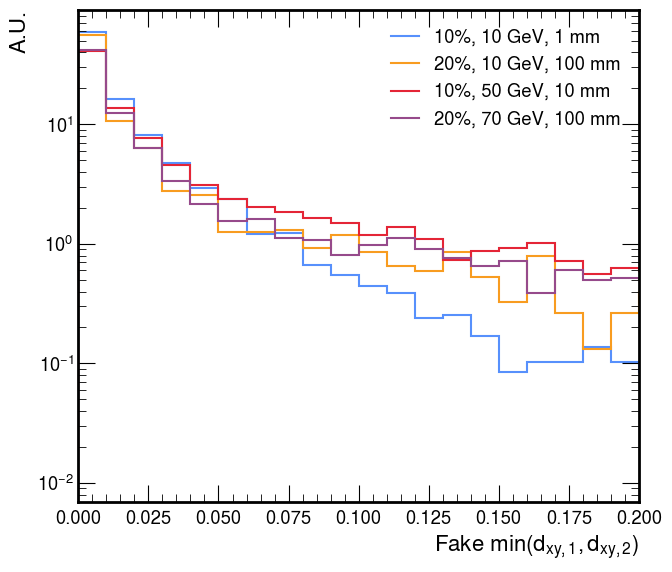

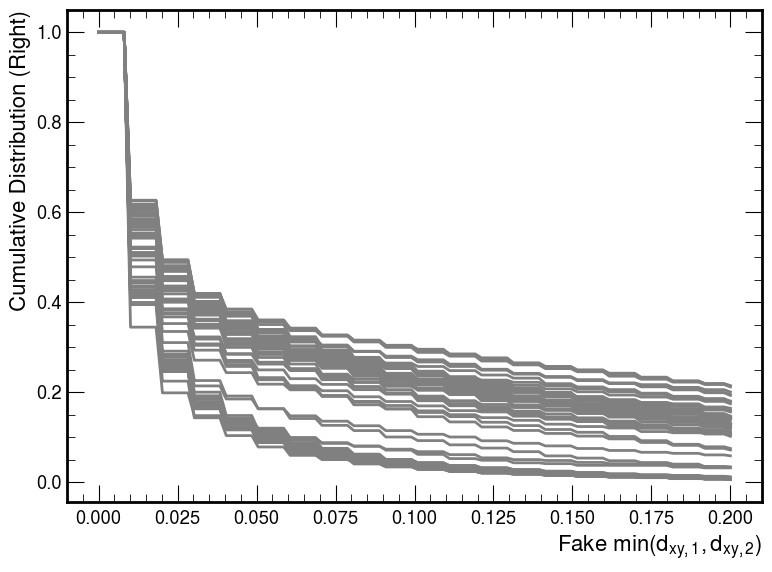

In [21]:
outD = "plots_genVars/fake_vtx/"
outName = "fake_vtx_minDxyZoomZoom_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake $\min(d_{xy,1},d_{xy,2})$"
ylabel = "A.U."
hname = "fake_vtx_mindxy"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlim=[0,0.2],xlabel=xlabel,ylabel=ylabel,rebin=1j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/fake_vtx_cdfs/"
outName = "fake_cdf_vtx_minDxyZoomZoom_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlim=[0,0.2],xlabel=xlabel,save=True,show=True,right=True)

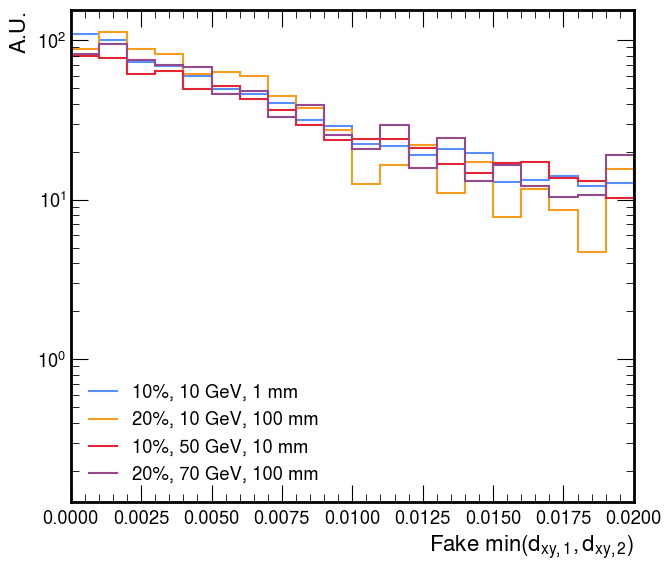

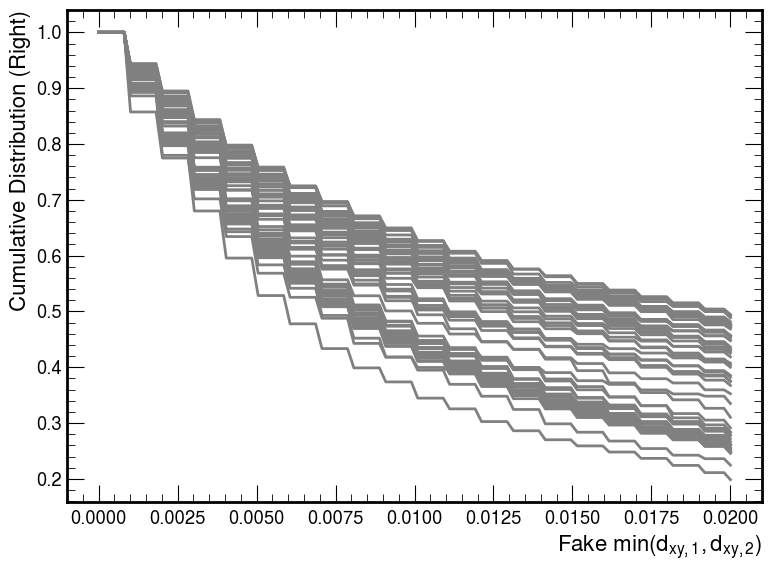

In [22]:
outD = "plots_genVars/fake_vtx/"
outName = "fake_vtx_minDxy_low_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake $\min(d_{xy,1},d_{xy,2})$"
ylabel = "A.U."
hname = "fake_vtx_mindxy_low"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlim=[0,0.02],xlabel=xlabel,ylabel=ylabel,rebin=1j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/fake_vtx_cdfs/"
outName = "fake_cdf_vtx_minDxy_low_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlim=[0,0.02],xlabel=xlabel,save=True,show=True,right=True)

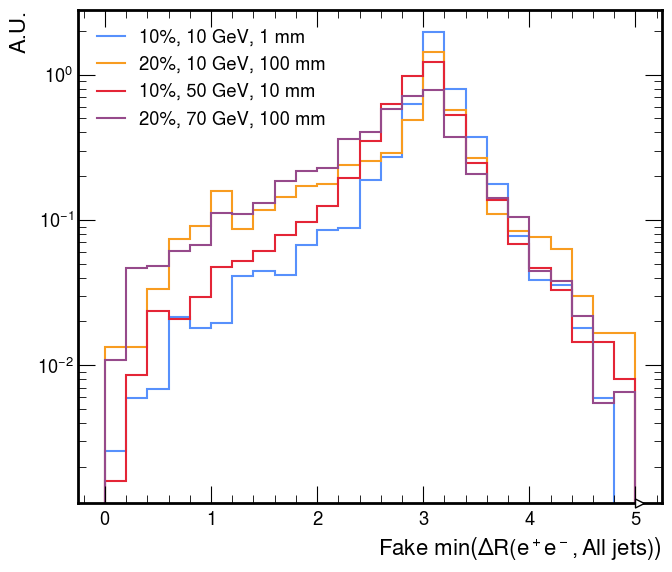

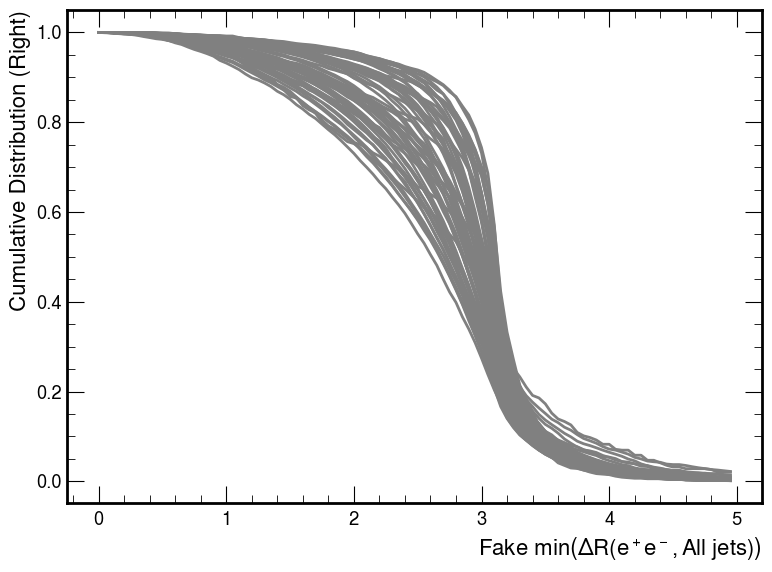

In [23]:
outD = "plots_genVars/fake_vtx/"
outName = "fake_vtx_mindRj_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake $\min \left(\Delta R(e^+e^-,\text{All jets})\right)$"
ylabel = "A.U."
hname = "fake_vtx_mindRj"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=4j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/fake_vtx_cdfs/"
outName = "fake_cdf_vtx_mindRj_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

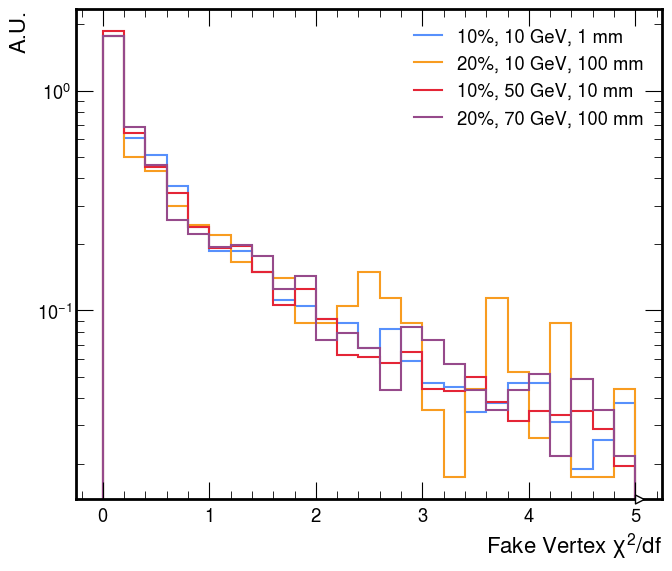

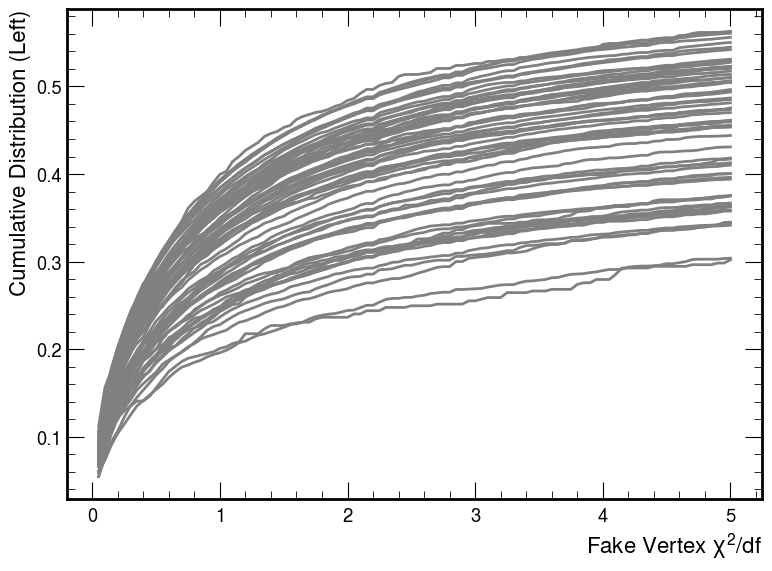

In [24]:
outD = "plots_genVars/fake_vtx/"
outName = "fake_vtx_chi2_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake Vertex $\chi^2/df$"
ylabel = "A.U."
hname = "fake_vtx_chi2"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=4j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/fake_vtx_cdfs/"
outName = "fake_cdf_vtx_chi2_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=False)

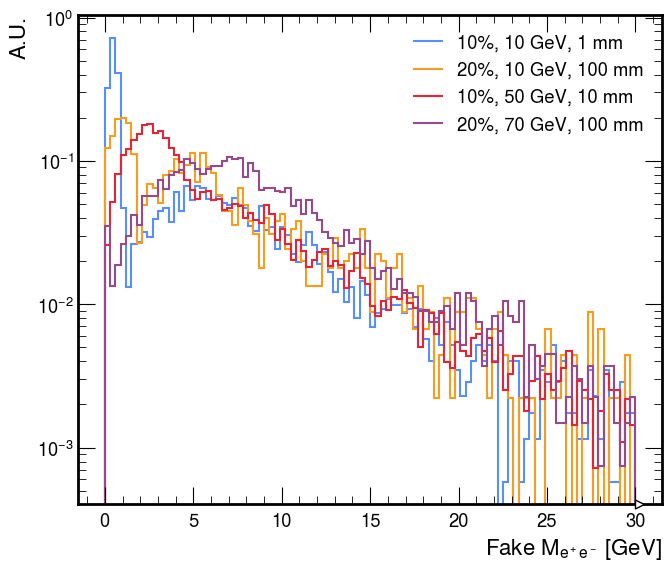

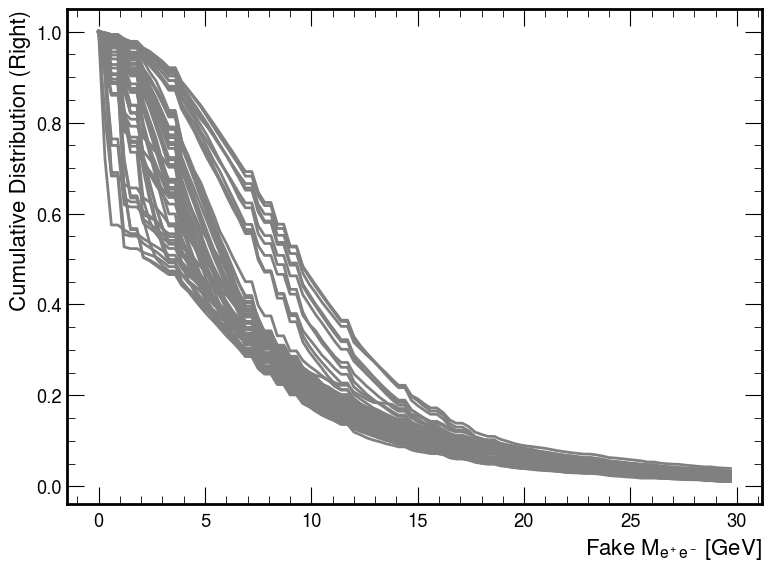

In [25]:
outD = "plots_genVars/fake_vtx/"
outName = "fake_vtx_mass_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake $M_{e^+e^-}$ [GeV]"
ylabel = "A.U."
hname = "fake_vtx_mass"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=1j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/fake_vtx_cdfs/"
outName = "fake_cdf_vtx_mass_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

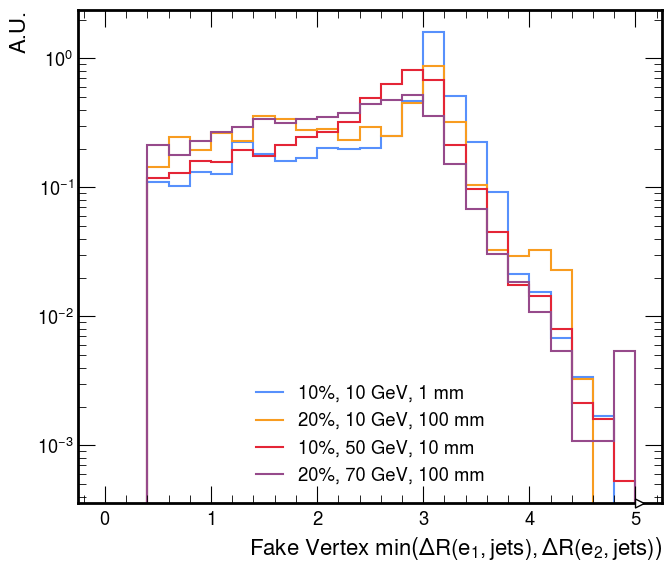

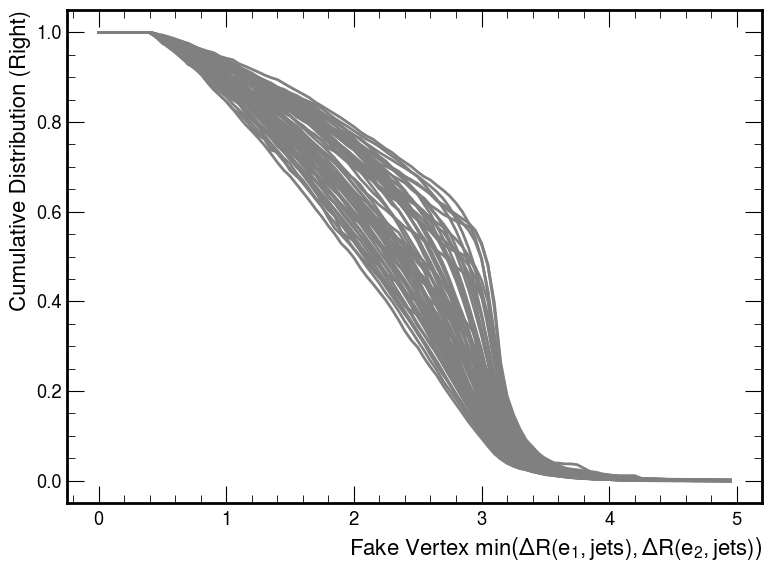

In [26]:
outD = "plots_genVars/fake_vtx/"
outName = "fake_vtx_minEleDrJ_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake Vertex $\min\left(\Delta R(e_1,\text{jets}),\Delta R(e_2,\text{jets})\right)$"
ylabel = "A.U."
hname = "fake_vtx_minEleDrJ"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=4j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/fake_vtx_cdfs/"
outName = "fake_cdf_vtx_minEleDrJ_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

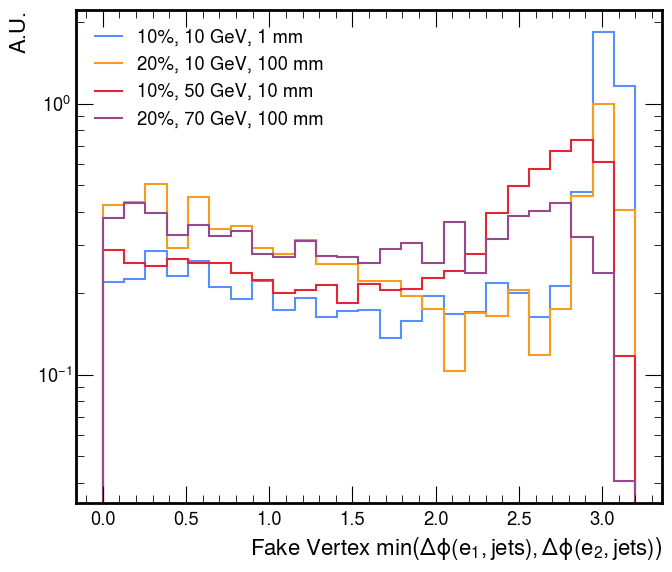

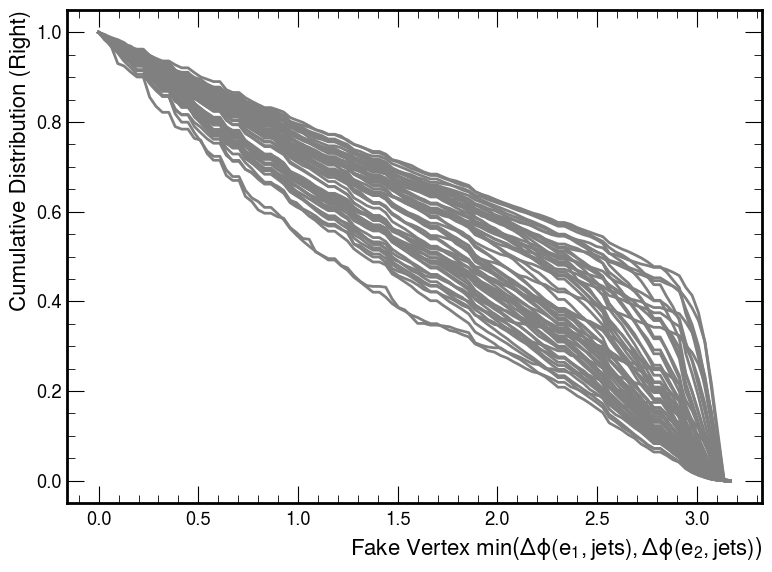

In [27]:
outD = "plots_genVars/fake_vtx/"
outName = "fake_vtx_minEleDPhiJ_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake Vertex $\min\left(\Delta \phi(e_1,\text{jets}),\Delta \phi(e_2,\text{jets})\right)$"
ylabel = "A.U."
hname = "fake_vtx_minEleDPhiJ"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=4j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/fake_vtx_cdfs/"
outName = "fake_cdf_vtx_minEleDPhiJ_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

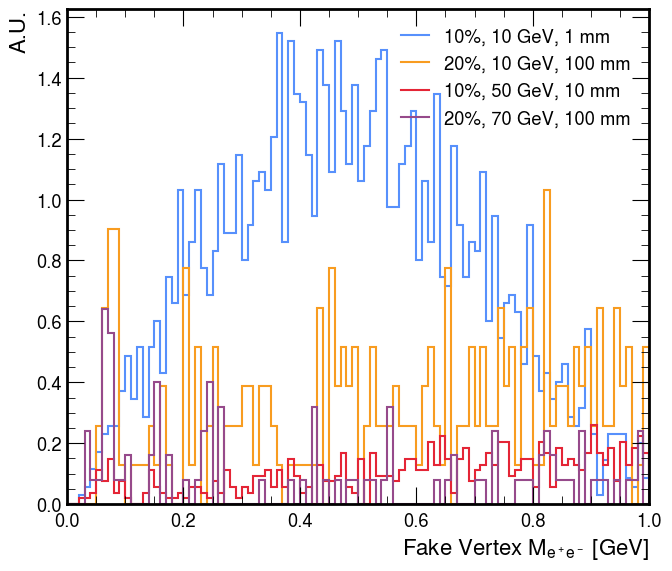

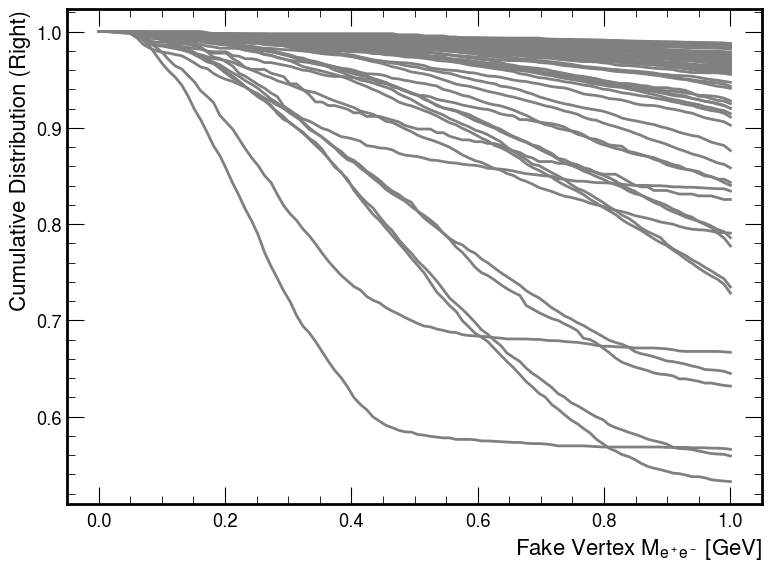

In [28]:
outD = "plots_genVars/fake_vtx/"
outName = "fake_vtx_mass_low_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake Vertex $M_{e^+e^-}$ [GeV]"
ylabel = "A.U."
hname = "fake_vtx_mass_low"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=1j,save=True,show=True,logy=False,yerr=False,
            xlim=[0,1])
outD = "plots_genVars/fake_vtx_cdfs/"
outName = "fake_cdf_vtx_mass_low_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,xlim=[0,1],save=True,show=True,right=True)

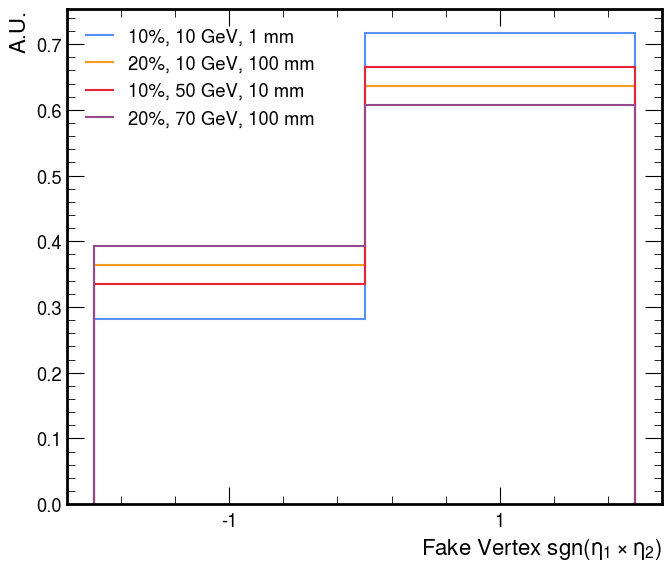

In [29]:
outD = "plots_genVars/fake_vtx/"
outName = "fake_vtx_signEtaProd_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake Vertex $\mathrm{sgn}(\eta_1\times\eta_2)$"
ylabel = "A.U."
hname = "fake_vtx_sign_etaProd"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=1j,save=True,show=True,logy=False,yerr=False)

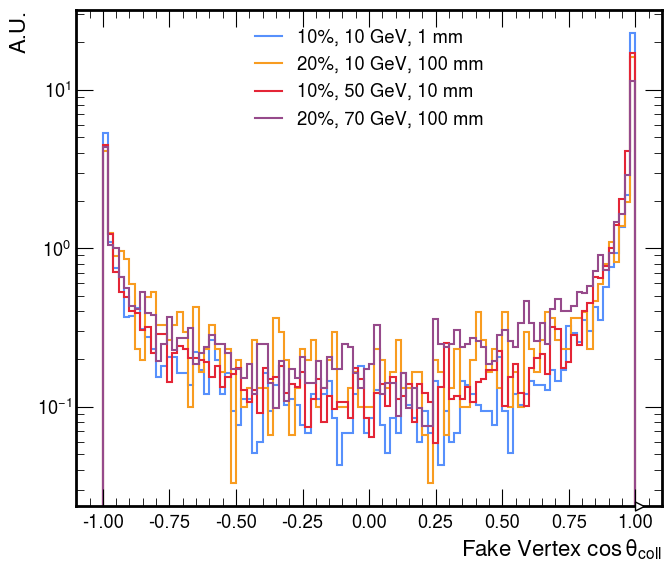

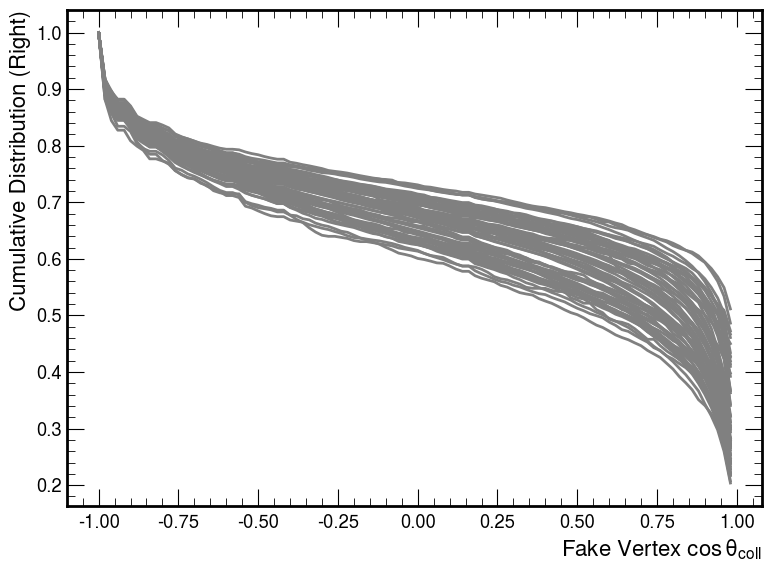

In [30]:
outD = "plots_genVars/fake_vtx/"
outName = "fake_vtx_cosThetaColl_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake Vertex $\cos \theta_\mathrm{coll}$"
ylabel = "A.U."
hname = "fake_vtx_CosThetaColl"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=1j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/fake_vtx_cdfs/"
outName = "fake_cdf_vtx_cosThetaColl_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

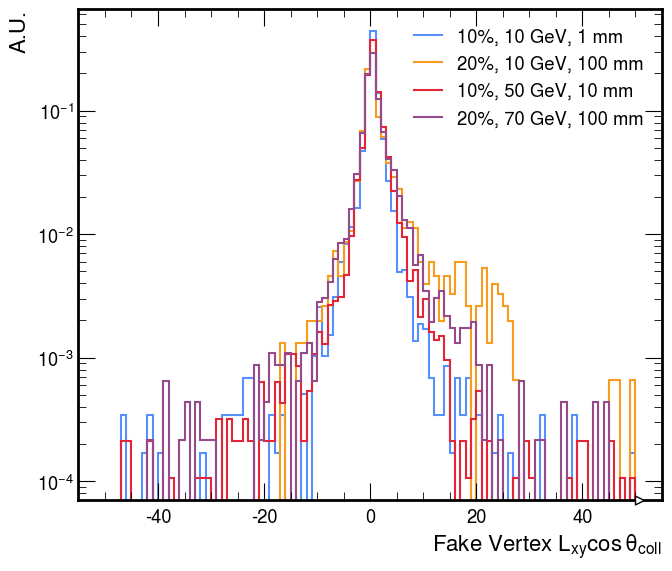

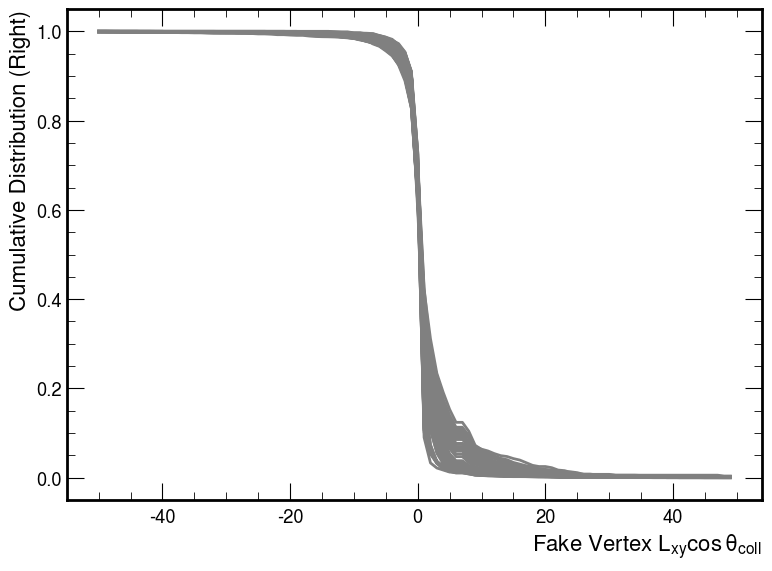

In [31]:
outD = "plots_genVars/fake_vtx/"
outName = "fake_vtx_LxyCosThetaColl_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake Vertex $L_{xy}\cos \theta_\mathrm{coll}$"
ylabel = "A.U."
hname = "fake_vtx_LxyCosThetaColl"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=1j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/fake_vtx_cdfs/"
outName = "fake_cdf_vtx_LxyCosThetaColl_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

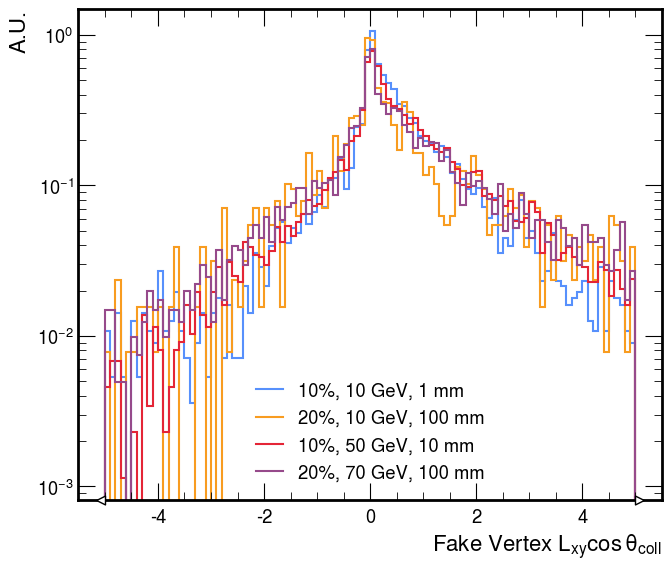

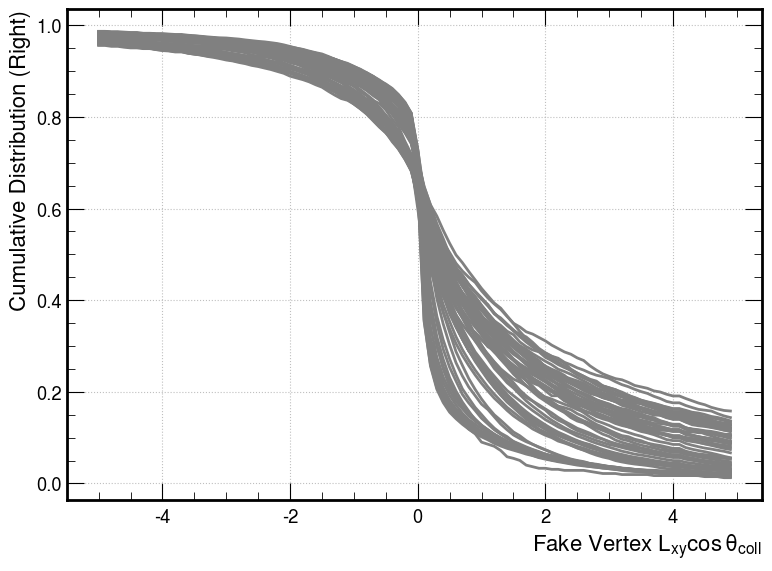

In [8]:
outD = "plots_genVars/fake_vtx/"
outName = "fake_vtx_LxyCosThetaCollZoom_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake Vertex $L_{xy}\cos \theta_\mathrm{coll}$"
ylabel = "A.U."
hname = "fake_vtx_LxyCosThetaCollZoom"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=1j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/fake_vtx_cdfs/"
outName = "fake_cdf_vtx_LxyCosThetaCollZoom_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

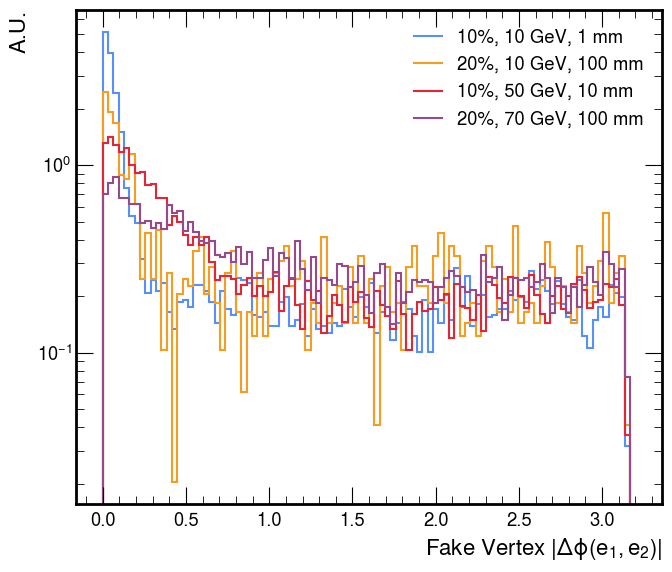

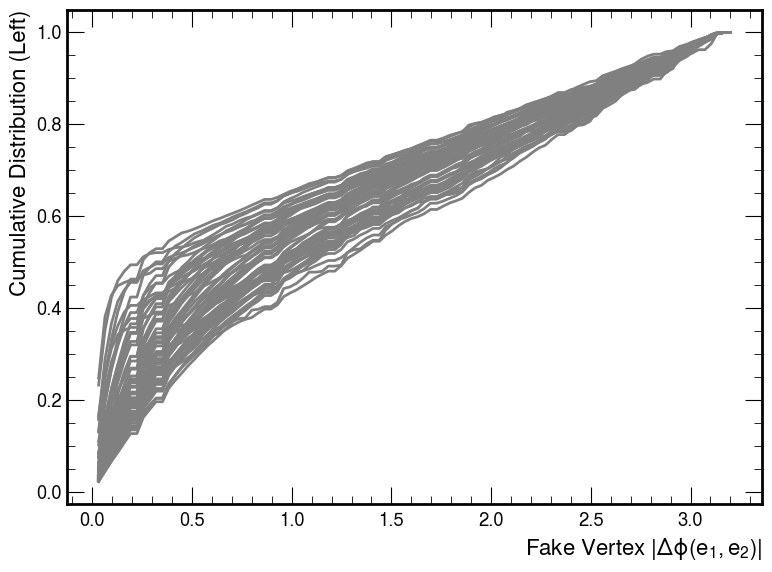

In [32]:
outD = "plots_genVars/fake_vtx/"
outName = "fake_vtx_eleDphi_selectedSignals"
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake Vertex $|\Delta \phi(e_1,e_2)|$"
ylabel = "A.U."
hname = "fake_vtx_eleDphi"
plot_samples(hcs,hname,selection,selected_signals,selected_labels,outName,outD,
             figsize=(7,6),xlabel=xlabel,ylabel=ylabel,rebin=1j,save=True,show=True,logy=True,yerr=False)
outD = "plots_genVars/fake_vtx_cdfs/"
outName = "fake_cdf_vtx_eleDphi_selectedSignals"
make_cdf_summary(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=False)

# Fake vs gen-matched CDFs

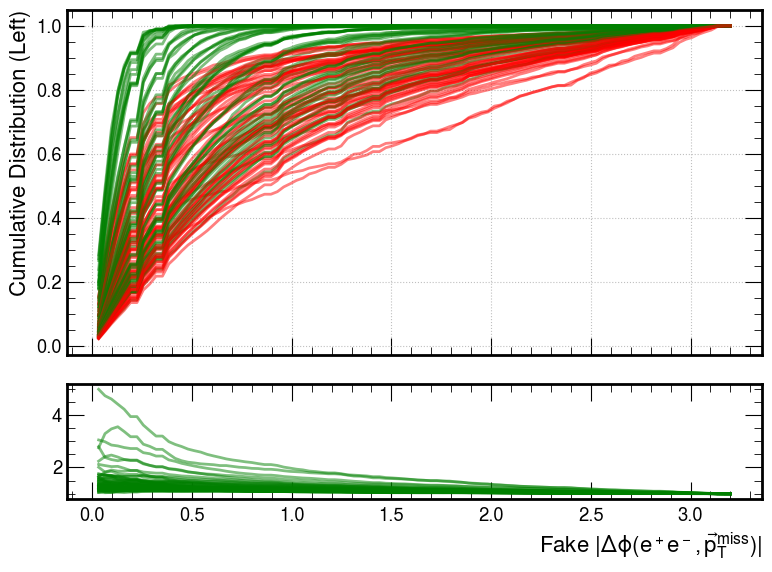

In [19]:
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake $|\Delta\phi(e^+e^-,\vec{p}_T^\mathrm{miss})|$"
ylabel = "A.U."
hname = "match_vtx_METdPhi"
outD = "plots_genVars/fake_vs_match_vtx_cdfs/"
outName = "fake_vs_match_cdf_vtxMETdPhi_selectedSignals"
make_cdf_summary_fakeVReal(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=False)

/tmp/ipykernel_749/669816292.py:24: RuntimeWarning: invalid value encountered in divide
  plt.plot(x,eff_real/eff_fake,color='green',alpha=alpha,lw=2)


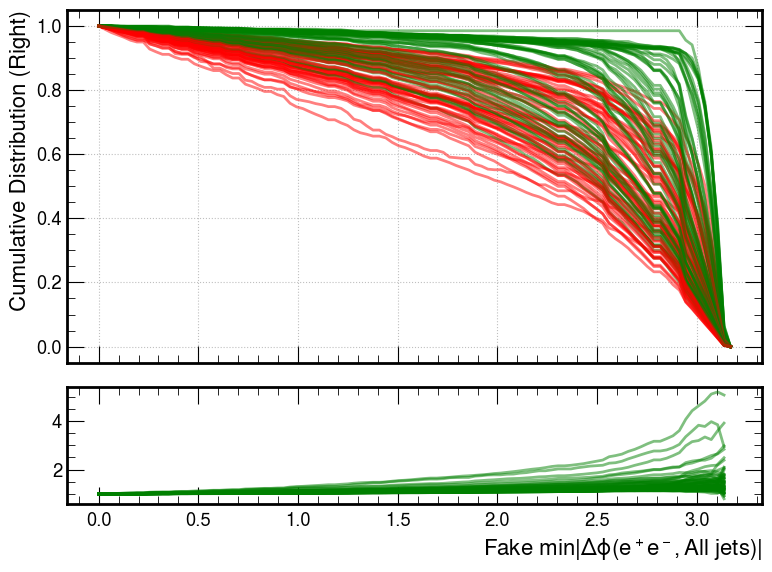

In [20]:
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake $\min |\Delta\phi(e^+e^-,\text{All jets})|$"
ylabel = "A.U."
hname = "match_vtx_mindPhiJ"
outD = "plots_genVars/fake_vs_match_vtx_cdfs/"
outName = "fake_vs_match_cdf_minJetMETdPhi_selectedSignals"
make_cdf_summary_fakeVReal(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True)

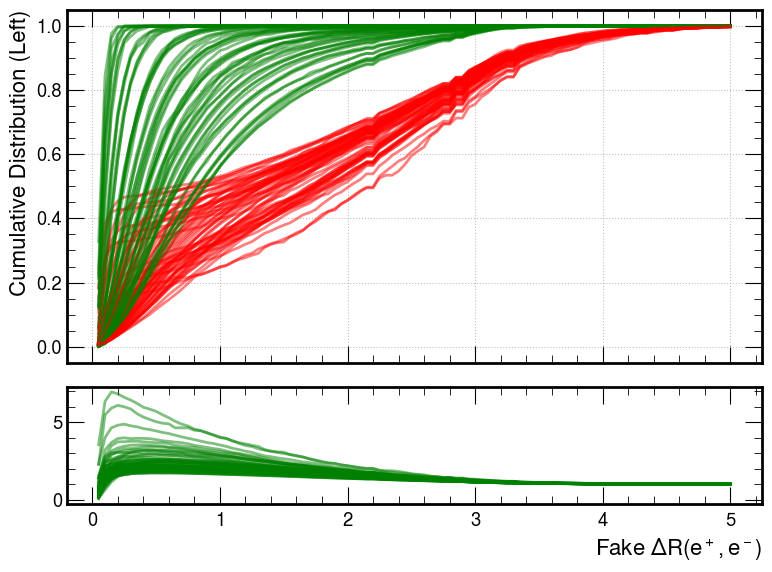

In [21]:
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake $\Delta R(e^+,e^-)$"
ylabel = "A.U."
hname = "match_vtx_dR"
outD = "plots_genVars/fake_vs_match_vtx_cdfs/"
outName = "fake_vs_match_cdf_vtx_dR_selectedSignals"
make_cdf_summary_fakeVReal(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=False)

/tmp/ipykernel_749/669816292.py:24: RuntimeWarning: divide by zero encountered in divide
  plt.plot(x,eff_real/eff_fake,color='green',alpha=alpha,lw=2)
/tmp/ipykernel_749/669816292.py:24: RuntimeWarning: invalid value encountered in divide
  plt.plot(x,eff_real/eff_fake,color='green',alpha=alpha,lw=2)


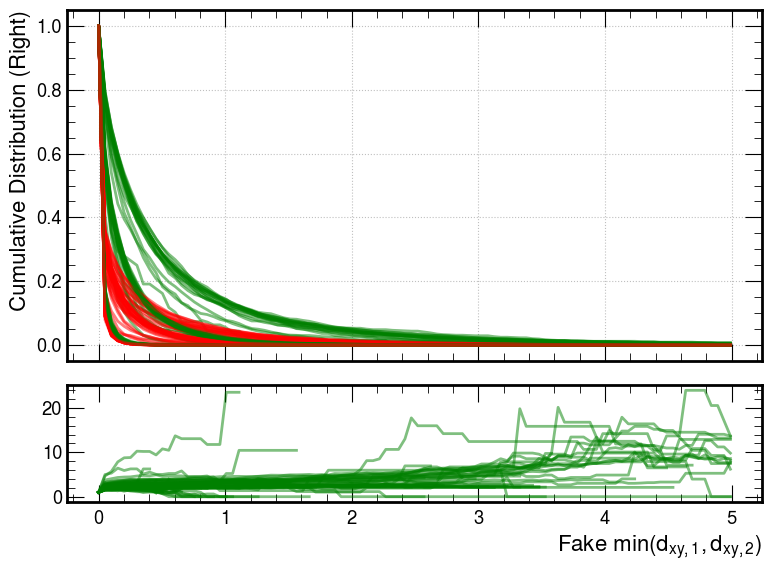

In [22]:
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake $\min(d_{xy,1},d_{xy,2})$"
ylabel = "A.U."
hname = "match_vtx_mindxy"
outD = "plots_genVars/fake_vs_match_vtx_cdfs/"
outName = "fake_vs_match_cdf_vtx_minDxy_selectedSignals"
make_cdf_summary_fakeVReal(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

/tmp/ipykernel_749/669816292.py:24: RuntimeWarning: divide by zero encountered in divide
  plt.plot(x,eff_real/eff_fake,color='green',alpha=alpha,lw=2)
/tmp/ipykernel_749/669816292.py:24: RuntimeWarning: invalid value encountered in divide
  plt.plot(x,eff_real/eff_fake,color='green',alpha=alpha,lw=2)


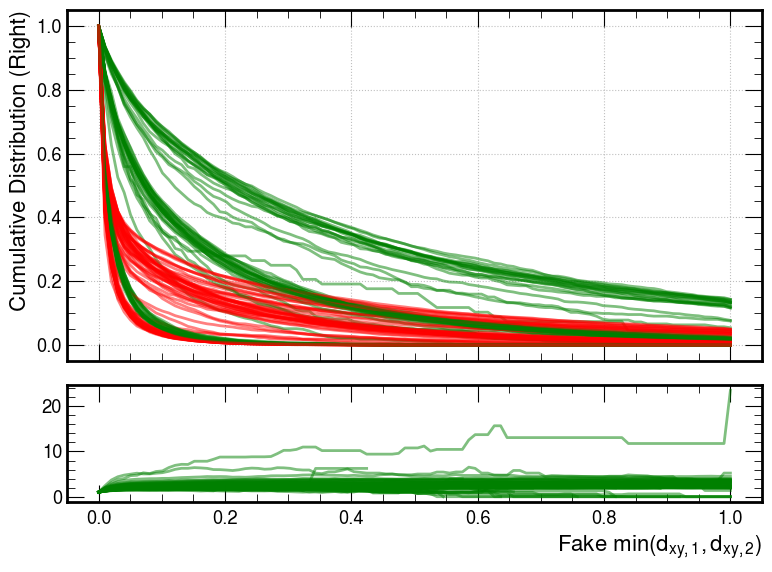

In [23]:
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake $\min(d_{xy,1},d_{xy,2})$"
ylabel = "A.U."
hname = "match_vtx_mindxy"
outD = "plots_genVars/fake_vs_match_vtx_cdfs/"
outName = "fake_vs_match_cdf_vtx_minDxyZoom_selectedSignals"
make_cdf_summary_fakeVReal(hcs,hname,selection,outName,outD,xlim=[0,1],xlabel=xlabel,save=True,show=True,right=True)

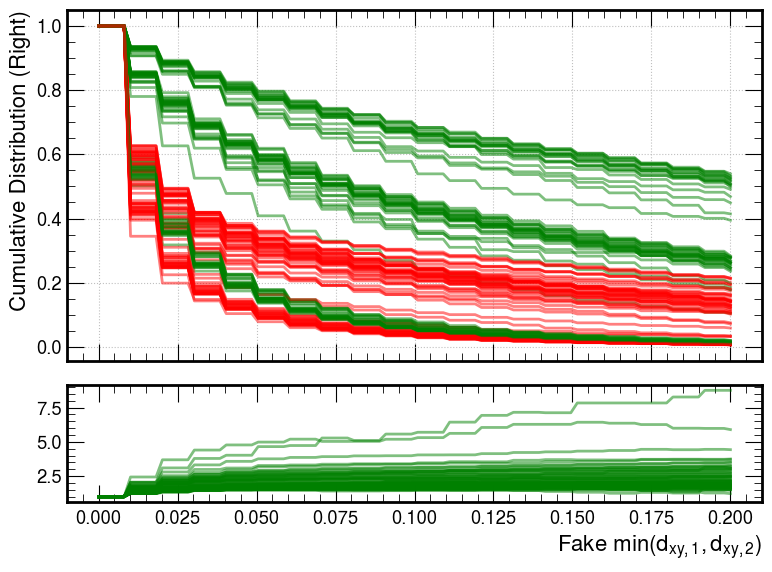

In [24]:
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake $\min(d_{xy,1},d_{xy,2})$"
ylabel = "A.U."
hname = "match_vtx_mindxy"
outD = "plots_genVars/fake_vs_match_vtx_cdfs/"
outName = "fake_vs_match_cdf_vtx_minDxyZoomZoom_selectedSignals"
make_cdf_summary_fakeVReal(hcs,hname,selection,outName,outD,xlim=[0,0.2],xlabel=xlabel,save=True,show=True,right=True)

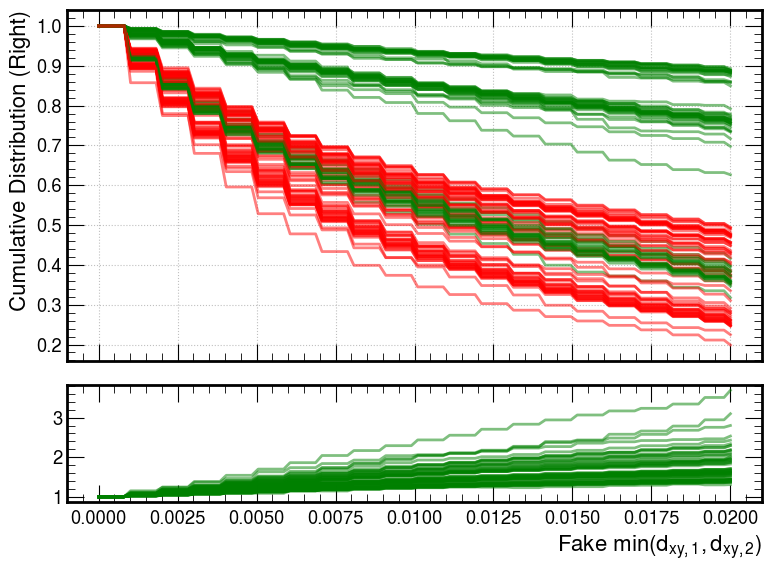

In [25]:
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake $\min(d_{xy,1},d_{xy,2})$"
ylabel = "A.U."
hname = "match_vtx_mindxy_low"
outD = "plots_genVars/fake_vs_match_vtx_cdfs/"
outName = "fake_vs_match_cdf_vtx_minDxy_low_selectedSignals"
make_cdf_summary_fakeVReal(hcs,hname,selection,outName,outD,xlim=[0,0.02],xlabel=xlabel,save=True,show=True,right=True)

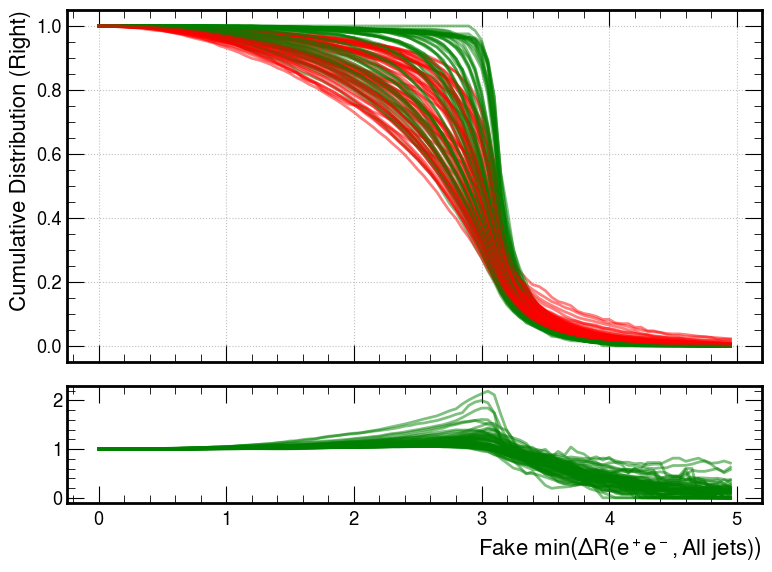

In [26]:
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake $\min \left(\Delta R(e^+e^-,\text{All jets})\right)$"
ylabel = "A.U."
hname = "match_vtx_mindRj"
outD = "plots_genVars/fake_vs_match_vtx_cdfs/"
outName = "fake_vs_match_cdf_vtx_mindRj_selectedSignals"
make_cdf_summary_fakeVReal(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

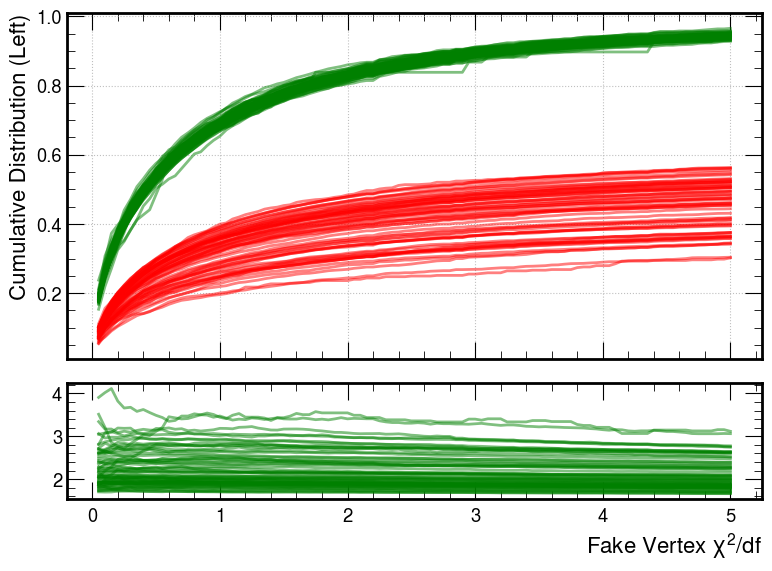

In [27]:
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake Vertex $\chi^2/df$"
ylabel = "A.U."
hname = "match_vtx_chi2"
outD = "plots_genVars/fake_vs_match_vtx_cdfs/"
outName = "fake_vs_match_cdf_vtx_chi2_selectedSignals"
make_cdf_summary_fakeVReal(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=False)

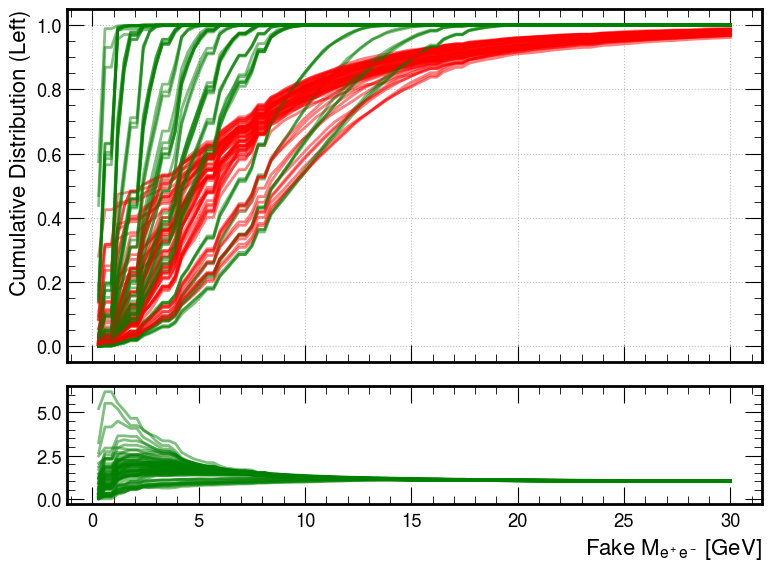

In [30]:
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake $M_{e^+e^-}$ [GeV]"
ylabel = "A.U."
hname = "match_vtx_mass"
outD = "plots_genVars/fake_vs_match_vtx_cdfs/"
outName = "fake_vs_match_cdf_vtx_mass_selectedSignals"
make_cdf_summary_fakeVReal(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=False)

/tmp/ipykernel_749/669816292.py:24: RuntimeWarning: invalid value encountered in divide
  plt.plot(x,eff_real/eff_fake,color='green',alpha=alpha,lw=2)
/tmp/ipykernel_749/669816292.py:24: RuntimeWarning: divide by zero encountered in divide
  plt.plot(x,eff_real/eff_fake,color='green',alpha=alpha,lw=2)


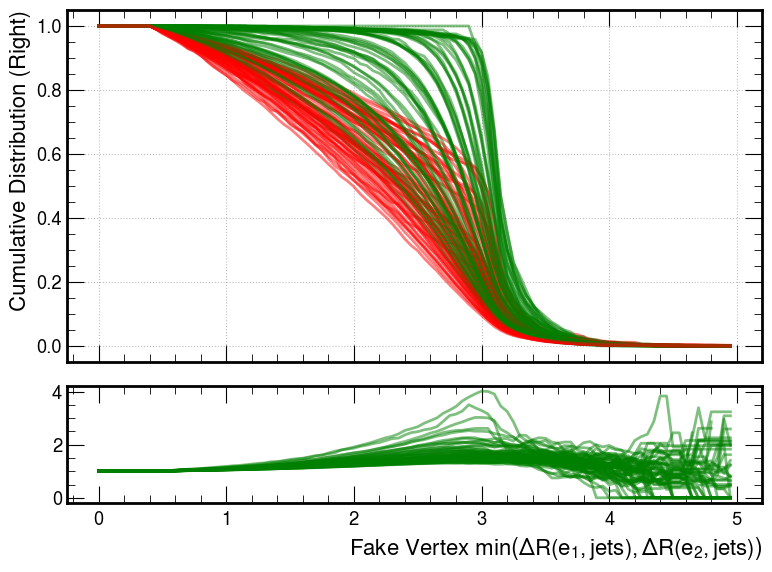

In [31]:
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake Vertex $\min\left(\Delta R(e_1,\text{jets}),\Delta R(e_2,\text{jets})\right)$"
ylabel = "A.U."
hname = "match_vtx_minEleDrJ"
outD = "plots_genVars/fake_vs_match_vtx_cdfs/"
outName = "fake_vs_match_cdf_vtx_minEleDrJ_selectedSignals"
make_cdf_summary_fakeVReal(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

/tmp/ipykernel_749/669816292.py:24: RuntimeWarning: invalid value encountered in divide
  plt.plot(x,eff_real/eff_fake,color='green',alpha=alpha,lw=2)


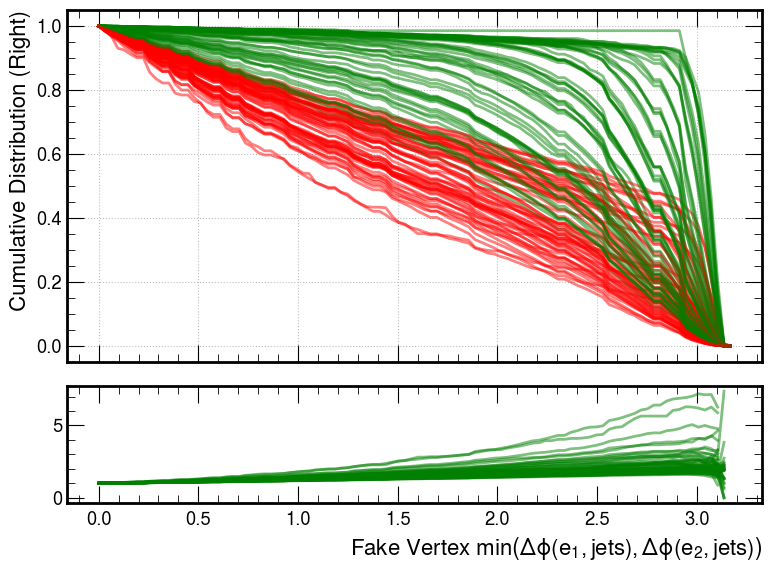

In [32]:
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake Vertex $\min\left(\Delta \phi(e_1,\text{jets}),\Delta \phi(e_2,\text{jets})\right)$"
ylabel = "A.U."
hname = "match_vtx_minEleDPhiJ"
outD = "plots_genVars/fake_vs_match_vtx_cdfs/"
outName = "fake_vs_match_cdf_vtx_minEleDPhiJ_selectedSignals"
make_cdf_summary_fakeVReal(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

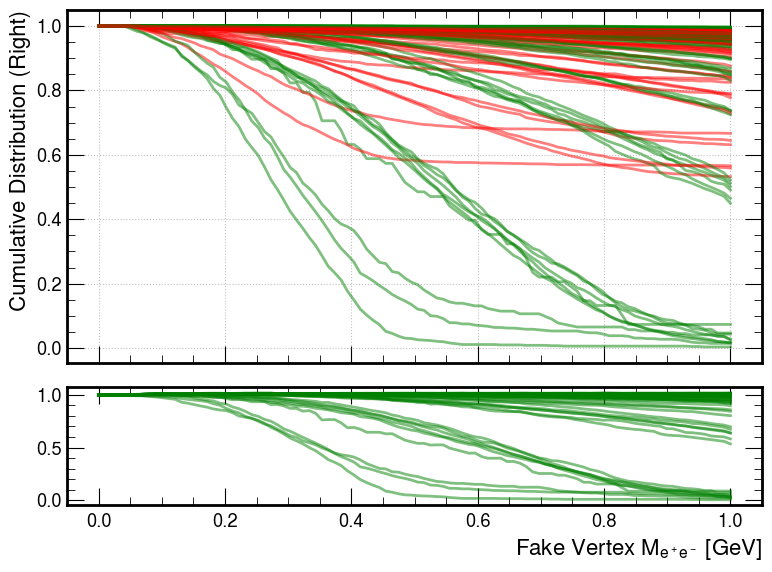

In [33]:
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake Vertex $M_{e^+e^-}$ [GeV]"
ylabel = "A.U."
hname = "match_vtx_mass_low"
outD = "plots_genVars/fake_vs_match_vtx_cdfs/"
outName = "fake_vs_match_cdf_vtx_mass_low_selectedSignals"
make_cdf_summary_fakeVReal(hcs,hname,selection,outName,outD,xlabel=xlabel,xlim=[0,1],save=True,show=True,right=True)

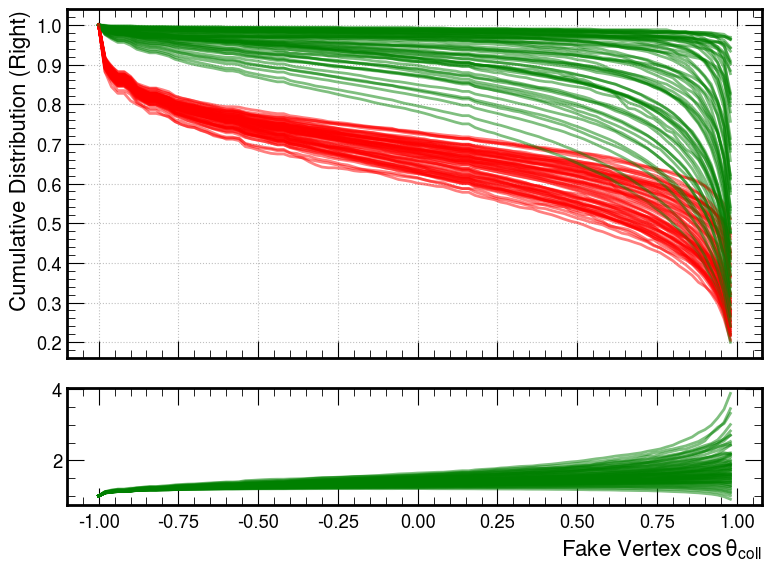

In [34]:
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake Vertex $\cos \theta_\mathrm{coll}$"
ylabel = "A.U."
hname = "match_vtx_CosThetaColl"
outD = "plots_genVars/fake_vs_match_vtx_cdfs/"
outName = "fake_vs_match_cdf_vtx_cosThetaColl_selectedSignals"
make_cdf_summary_fakeVReal(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

/tmp/ipykernel_749/669816292.py:24: RuntimeWarning: invalid value encountered in divide
  plt.plot(x,eff_real/eff_fake,color='green',alpha=alpha,lw=2)
/tmp/ipykernel_749/669816292.py:24: RuntimeWarning: divide by zero encountered in divide
  plt.plot(x,eff_real/eff_fake,color='green',alpha=alpha,lw=2)


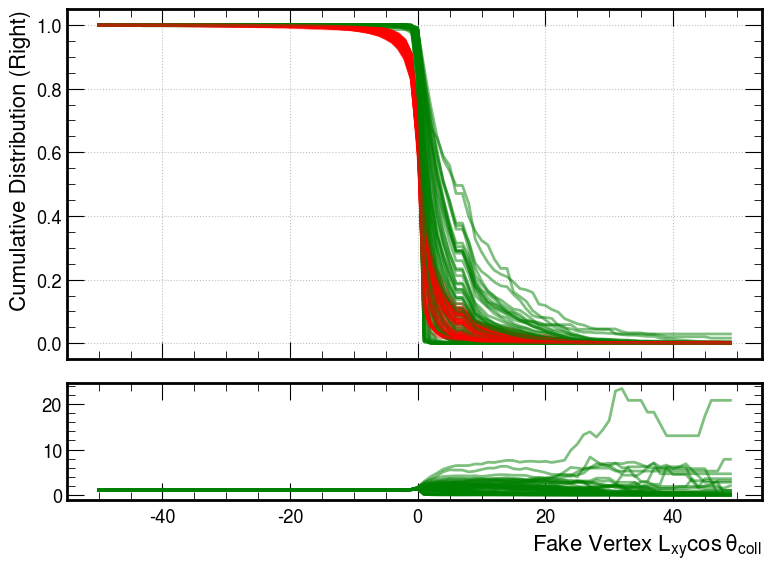

In [35]:
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake Vertex $L_{xy}\cos \theta_\mathrm{coll}$"
ylabel = "A.U."
hname = "match_vtx_LxyCosThetaColl"
outD = "plots_genVars/fake_vs_match_vtx_cdfs/"
outName = "fake_vs_match_cdf_vtx_LxyCosThetaColl_selectedSignals"
make_cdf_summary_fakeVReal(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

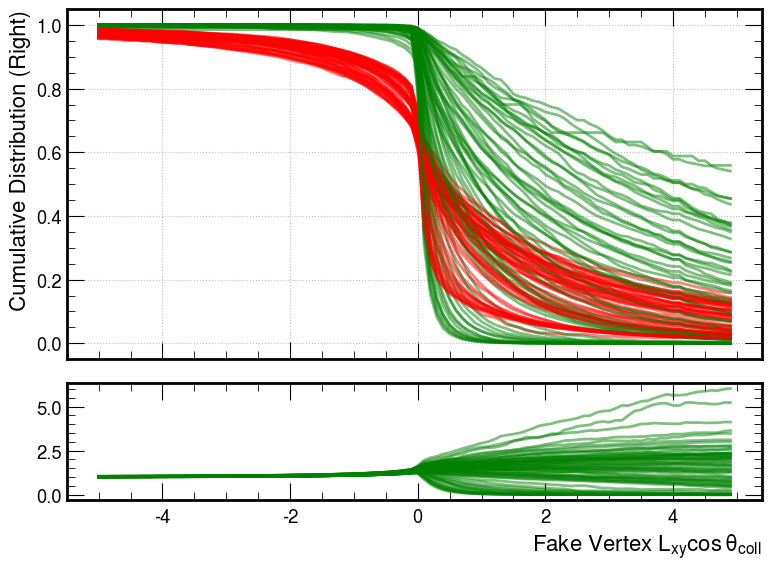

In [36]:
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake Vertex $L_{xy}\cos \theta_\mathrm{coll}$"
ylabel = "A.U."
hname = "match_vtx_LxyCosThetaCollZoom"
outD = "plots_genVars/fake_vs_match_vtx_cdfs/"
outName = "fake_vs_match_cdf_vtx_LxyCosThetaCollZoom_selectedSignals"
make_cdf_summary_fakeVReal(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

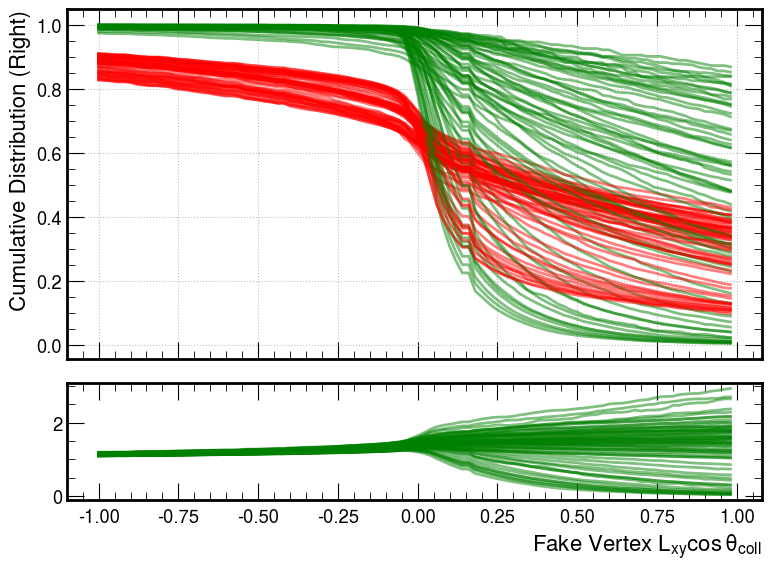

In [8]:
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake Vertex $L_{xy}\cos \theta_\mathrm{coll}$"
ylabel = "A.U."
hname = "match_vtx_LxyCosThetaCollZoomZoom"
outD = "plots_genVars/fake_vs_match_vtx_cdfs/"
outName = "fake_vs_match_cdf_vtx_LxyCosThetaCollZoomZoom_selectedSignals"
make_cdf_summary_fakeVReal(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=True)

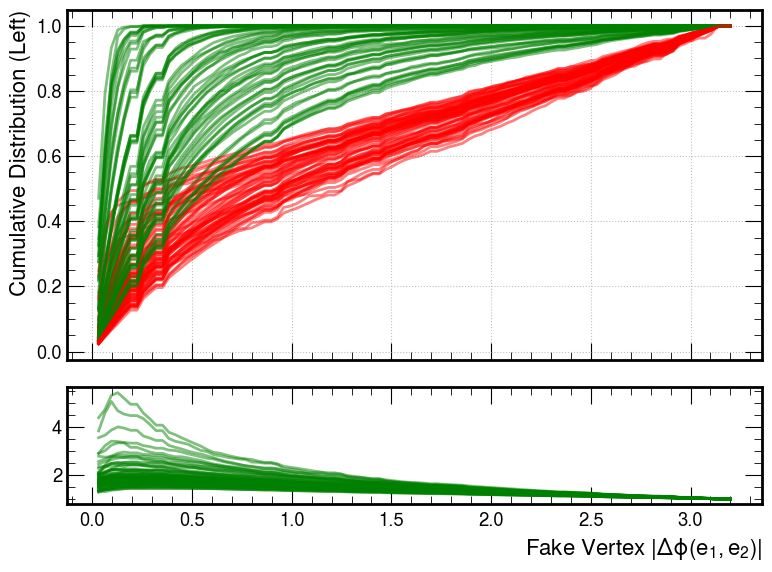

In [37]:
selection = {"cut":"cut0","vtype":sum}
xlabel = r"Fake Vertex $|\Delta \phi(e_1,e_2)|$"
ylabel = "A.U."
hname = "match_vtx_eleDphi"
outD = "plots_genVars/fake_vs_match_vtx_cdfs/"
outName = "fake_vs_match_cdf_vtx_eleDphi_selectedSignals"
make_cdf_summary_fakeVReal(hcs,hname,selection,outName,outD,xlabel=xlabel,save=True,show=True,right=False)

# Other plots

/opt/conda/lib/python3.9/site-packages/hist/basehist.py:400: UserWarning: List indexing selection is experimental. Removed bins are not placed in overflow.
  return super().__getitem__(self._index_transform(index))


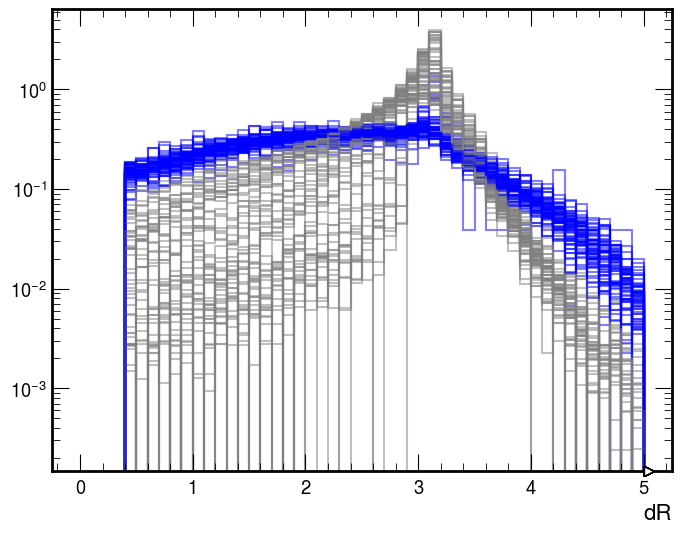

In [24]:
plt.figure(figsize=(8,6))
hm = hcs.load("match_ele_mindRJets")[{"cut":"cut2","passID":[1,2,3],"match_type":sum}][{"passID":sum}]
hf = hcs.load("fake_ele_mindRJets")[{"cut":"cut2","passID":[1,2,3],"ele_type":sum}][{"passID":sum}]
for n in dfs.name:
    hpm = hm[{"samp":n}][::2j]
    hpf = hf[{"samp":n}][::2j]
    hep.histplot(hpm,color='gray',alpha=0.5,density=True,yerr=False)
    hep.histplot(hpf,color='blue',alpha=0.5,density=True,yerr=False)
plt.yscale('log')

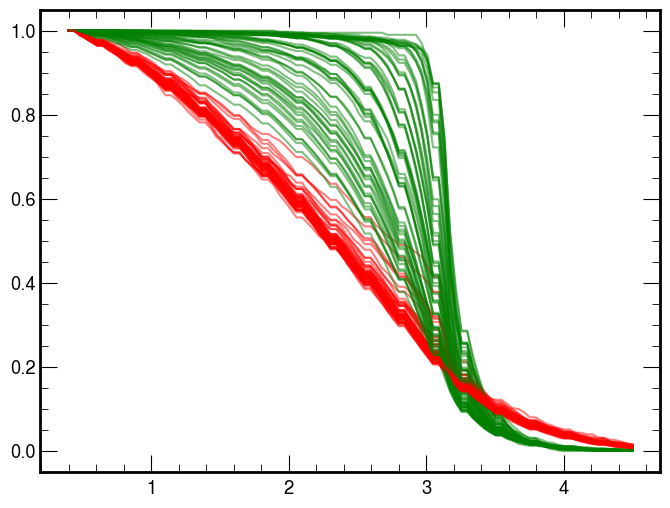

In [31]:
plt.figure(figsize=(8,6))
hm = hcs.load("match_ele_mindRJets")[{"cut":"cut2","passID":[1,2,3],"match_type":sum}][{"passID":sum}]
hf = hcs.load("fake_ele_mindRJets")[{"cut":"cut2","passID":[1,2,3],"ele_type":sum}][{"passID":sum}]
for n in dfs.name:
    hpm = hm[{"samp":n}]
    hpf = hf[{"samp":n}]
    x,cpm = ptools.makeCDF(hpm,0.4,4.5,bins=100,right=True)
    plt.plot(x,cpm,color='green',alpha=0.5)
    x,cpf = ptools.makeCDF(hpf,0.4,4.5,bins=100,right=True)
    plt.plot(x,cpf,color='red',alpha=0.5)
#plt.yscale('log')

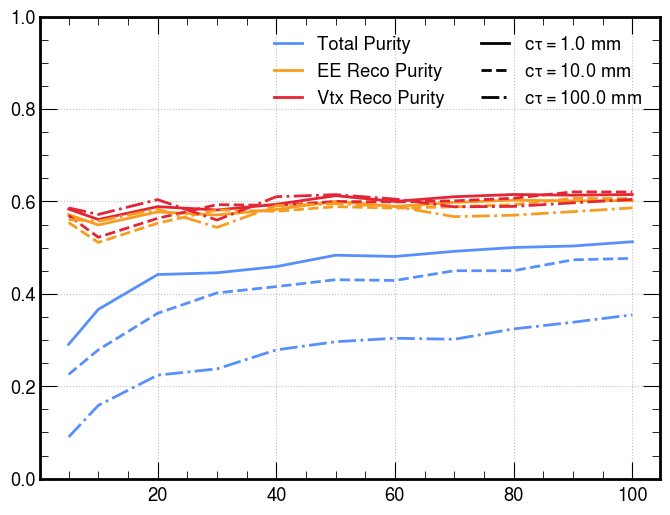

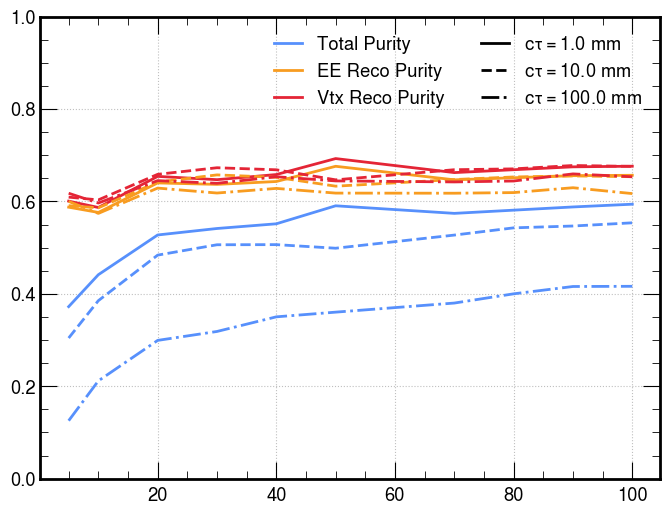

In [9]:
hcs = histContainer("signal_histos_sig_defaultGoodVtx.coffea")
dfs = utils.get_dict_fromCutflow(hcs.load('cutflow'))
def make_label(row):
    m1 = int(row['m1'])
    delta = int(100*row['delta'])
    ct = int(row['ctau'])
    label = f"{delta}%, {m1} GeV, {ct} mm"
    return label
dfs['legend'] = dfs.apply(make_label,axis=1)

from matplotlib.lines import Line2D
h = hcs.load("sel_vtx_purity")[{"cut":"cut0"}]
deltas = sorted(list(set(dfs.delta)))
for delta in deltas:
    plt.figure(figsize=(8,6))
    dfsel = dfs[dfs.delta==delta]
    ctaus = sorted(list(set(dfsel.ctau)))
    linestyles = ['-','--','-.']
    ct_handles = []
    for i,ct in enumerate(ctaus):
        ct_handles.append(Line2D([],[],lw=2,linestyle=linestyles[i],label=rf"$c\tau = {ct}$ mm",color='k'))
        dfsel1 = dfsel[dfsel.ctau==ct]
        m1s = sorted(list(set(dfsel1.m1)))
        tot_purity = []
        ee_purity = []
        vtx_purity = []
        for m1 in m1s:
            samp = dfsel1[dfsel1.m1==m1].name.item()
            hsel = h[{"samp":samp}]
            total = hsel[{"purity":"total"}].value
            tot_purity.append(hsel[{"purity":"n_matched"}].value/total)
            ee_purity.append(hsel[{"purity":"n_matched"}].value/hsel[{"purity":"n_eeReco"}].value)
            vtx_purity.append(hsel[{"purity":"n_matched"}].value/hsel[{"purity":"n_vtxReco"}].value)
        plt.plot(m1s,tot_purity,linestyle=linestyles[i],lw=2,color=f"C0")
        plt.plot(m1s,ee_purity,linestyle=linestyles[i],lw=2,color=f"C1")
        plt.plot(m1s,vtx_purity,linestyle=linestyles[i],lw=2,color=f"C2")
    type_handles = [Line2D([],[],lw=2,linestyle='-',label='Total Purity',color='C0'),
                    Line2D([],[],lw=2,linestyle='-',label='EE Reco Purity',color='C1'),
                    Line2D([],[],lw=2,linestyle='-',label='Vtx Reco Purity',color='C2')]
    plt.ylim([0,1])
    plt.grid()
    plt.legend(handles=type_handles+ct_handles,ncol=2)
    

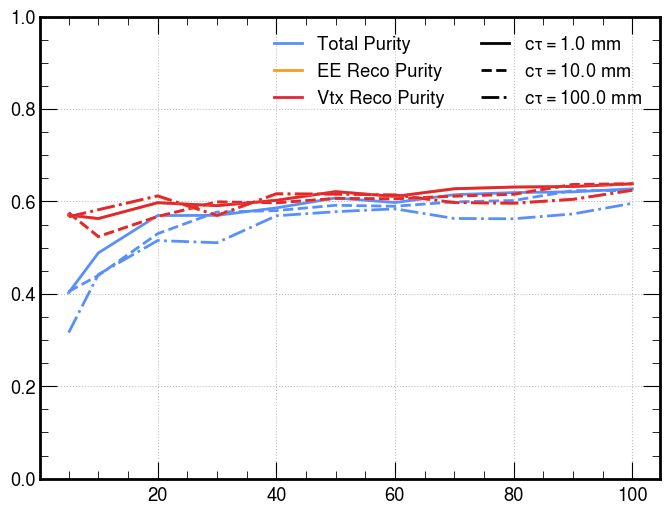

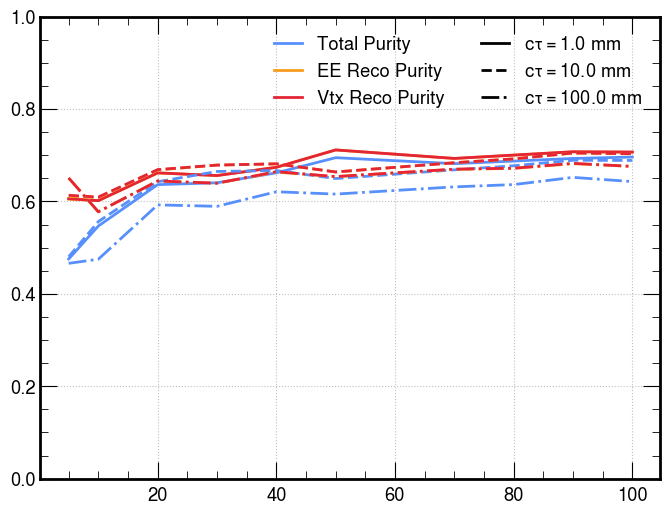

In [12]:
hcs = histContainer("signal_histos_sig_newGoodVtx.coffea")
dfs = utils.get_dict_fromCutflow(hcs.load('cutflow'))
def make_label(row):
    m1 = int(row['m1'])
    delta = int(100*row['delta'])
    ct = int(row['ctau'])
    label = f"{delta}%, {m1} GeV, {ct} mm"
    return label
dfs['legend'] = dfs.apply(make_label,axis=1)

from matplotlib.lines import Line2D
h = hcs.load("sel_vtx_purity")[{"cut":"cut0"}]
deltas = sorted(list(set(dfs.delta)))
for delta in deltas:
    plt.figure(figsize=(8,6))
    dfsel = dfs[dfs.delta==delta]
    ctaus = sorted(list(set(dfsel.ctau)))
    linestyles = ['-','--','-.']
    ct_handles = []
    for i,ct in enumerate(ctaus):
        ct_handles.append(Line2D([],[],lw=2,linestyle=linestyles[i],label=rf"$c\tau = {ct}$ mm",color='k'))
        dfsel1 = dfsel[dfsel.ctau==ct]
        m1s = sorted(list(set(dfsel1.m1)))
        tot_purity = []
        ee_purity = []
        vtx_purity = []
        for m1 in m1s:
            samp = dfsel1[dfsel1.m1==m1].name.item()
            hsel = h[{"samp":samp}]
            total = hsel[{"purity":"total"}].value
            tot_purity.append(hsel[{"purity":"n_matched"}].value/total)
            ee_purity.append(hsel[{"purity":"n_matched"}].value/hsel[{"purity":"n_eeReco"}].value)
            vtx_purity.append(hsel[{"purity":"n_matched"}].value/hsel[{"purity":"n_vtxReco"}].value)
        plt.plot(m1s,tot_purity,linestyle=linestyles[i],lw=2,color=f"C0")
        plt.plot(m1s,ee_purity,linestyle=linestyles[i],lw=2,color=f"C1")
        plt.plot(m1s,vtx_purity,linestyle=linestyles[i],lw=2,color=f"C2")
    type_handles = [Line2D([],[],lw=2,linestyle='-',label='Total Purity',color='C0'),
                    Line2D([],[],lw=2,linestyle='-',label='EE Reco Purity',color='C1'),
                    Line2D([],[],lw=2,linestyle='-',label='Vtx Reco Purity',color='C2')]
    plt.ylim([0,1])
    plt.grid()
    plt.legend(handles=type_handles+ct_handles,ncol=2)